# BANK CUSTOMER CHURN PREDICTION USING DECISION TREE

## 1. IMPORTING THE PYTHON LIBRARIES

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier, export_graphviz, export_text
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, f1_score, precision_score, recall_score, roc_auc_score

import graphviz
import pydotplus

print("Python Libraries Import Completed")

Python Libraries Import Completed


## 2. LOADING THE RAW DATA FROM A CSV FILE

In [4]:
actual_raw_data=pd.read_csv("Bank_Churn_Raw_Data.csv")
actual_raw_data

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9996,15606229,Obijiaku,771,France,Male,39,5,0.00,2,1,0,96270.64,0
9996,9997,15569892,Johnstone,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
9997,9998,15584532,Liu,709,France,Female,36,7,0.00,1,0,1,42085.58,1
9998,9999,15682355,Sabbatini,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1


## 3. DATA EXPLORATION

In [5]:
# Verifying the shape of the data

actual_raw_data.shape

(10000, 14)

In [6]:
# Displaying the first 5 Rows of Data Instances

actual_raw_data.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


In [7]:
# Displaying the last 5 Rows of Data Instances

actual_raw_data.tail()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
9995,9996,15606229,Obijiaku,771,France,Male,39,5,0.00,2,1,0,96270.64,0
9996,9997,15569892,Johnstone,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
9997,9998,15584532,Liu,709,France,Female,36,7,0.00,1,0,1,42085.58,1
9998,9999,15682355,Sabbatini,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1
9999,10000,15628319,Walker,792,France,Female,28,4,130142.79,1,1,0,38190.78,0


In [8]:
# Verifying the Column Names in the Raw Data

actual_raw_data.columns

Index(['RowNumber', 'CustomerId', 'Surname', 'CreditScore', 'Geography',
       'Gender', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Exited'],
      dtype='object')

In [9]:
# Verifying the Type of the Columns in the Raw Data

actual_raw_data.dtypes

RowNumber            int64
CustomerId           int64
Surname             object
CreditScore          int64
Geography           object
Gender              object
Age                  int64
Tenure               int64
Balance            float64
NumOfProducts        int64
HasCrCard            int64
IsActiveMember       int64
EstimatedSalary    float64
Exited               int64
dtype: object

In [10]:
# Verifying the Null Values in the Raw Data

actual_raw_data.isnull().sum()

RowNumber          0
CustomerId         0
Surname            0
CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64

## 4. DATA VISUALISATION

In [11]:
# Creating a New Data Frame To Include Only the Relevant Input Independent Variables and the Output Dependent Variable

raw_data = actual_raw_data[['CreditScore', 'Geography', 'Gender', 'Age', 'Tenure',
                           'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember',
                           'EstimatedSalary', 'Exited']]

raw_data

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
...,...,...,...,...,...,...,...,...,...,...,...
9995,771,France,Male,39,5,0.00,2,1,0,96270.64,0
9996,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
9997,709,France,Female,36,7,0.00,1,0,1,42085.58,1
9998,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1


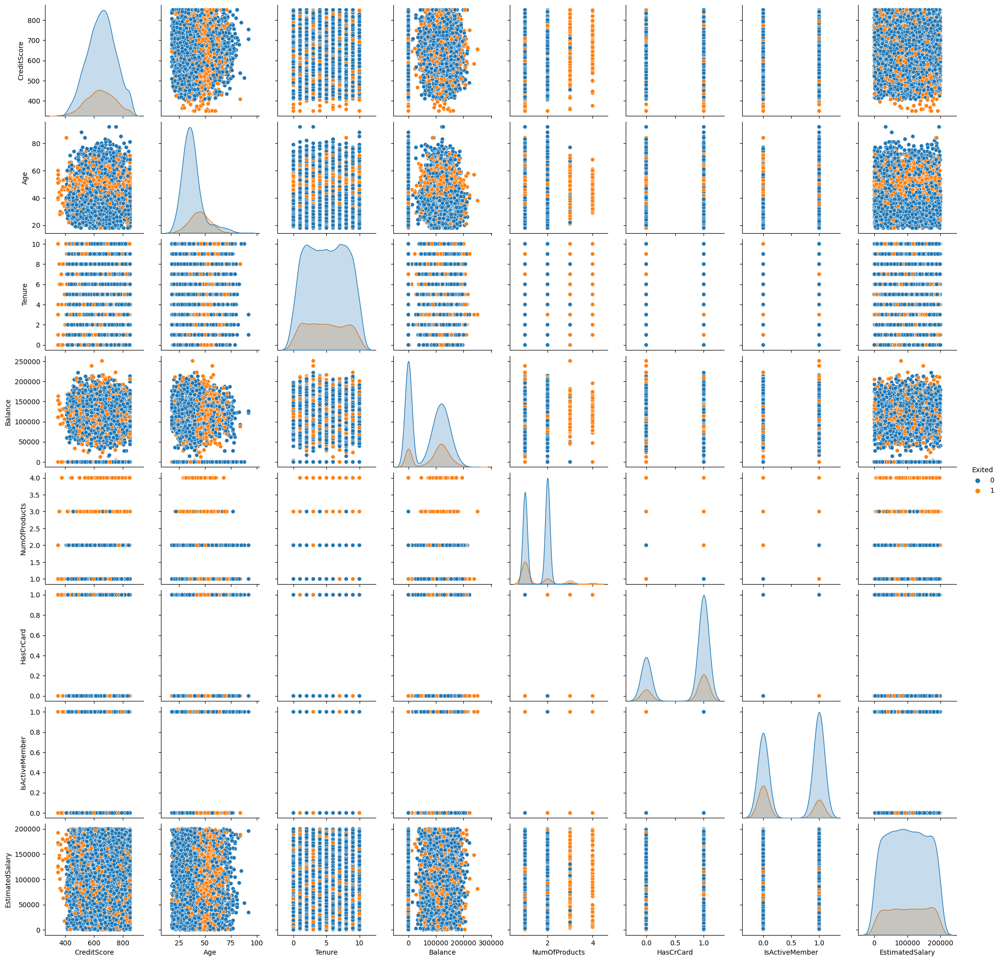

In [12]:
# Pair Plot - Visualising the Relationship Between The Variables

raw_data_graph = sns.pairplot(raw_data, hue='Exited', diag_kws={'bw_method':0.2})

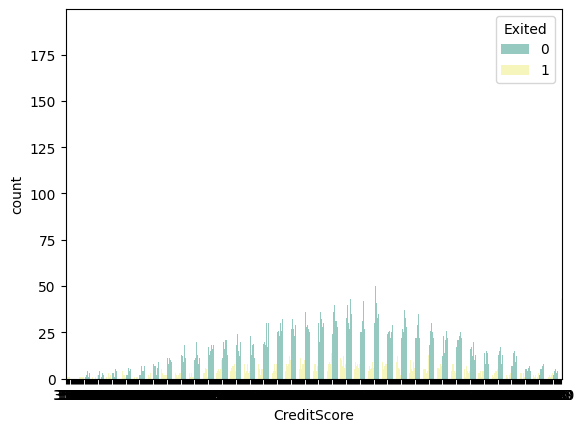

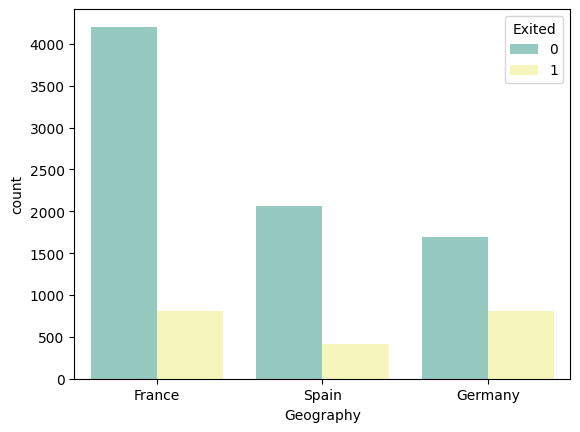

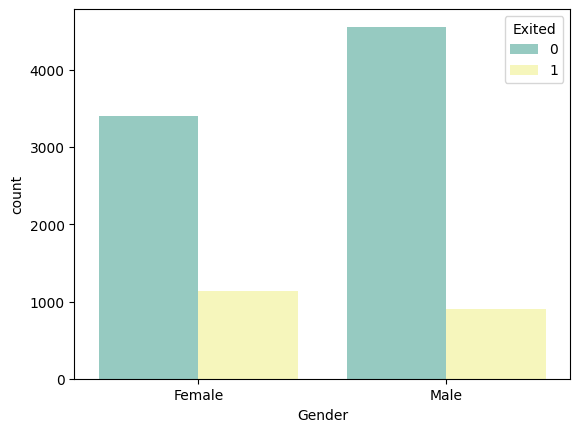

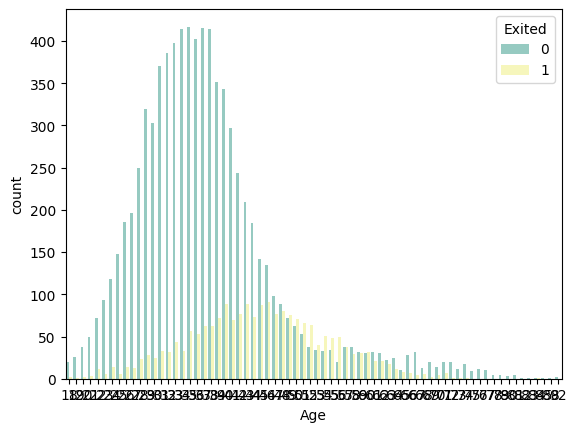

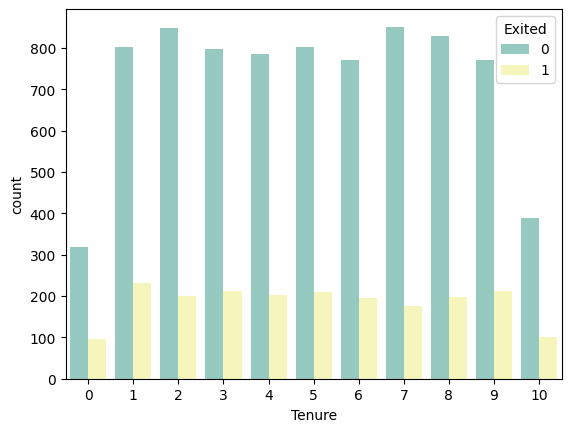

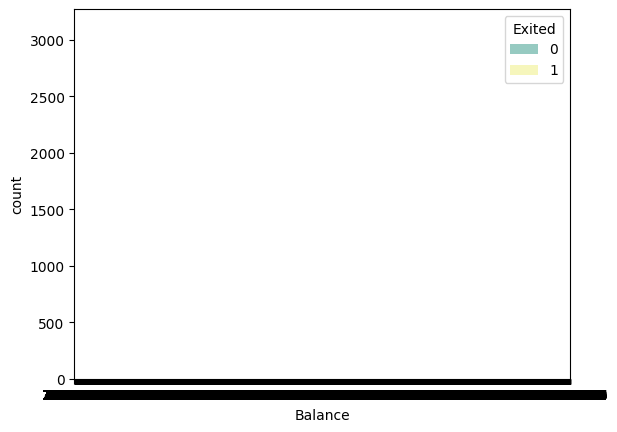

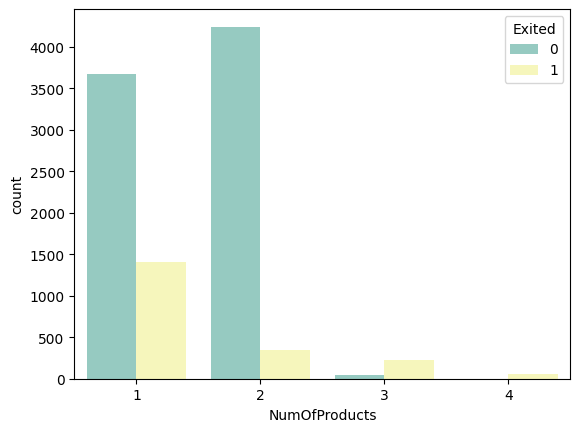

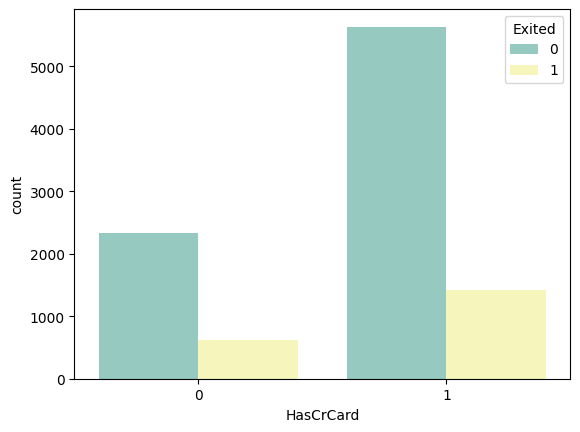

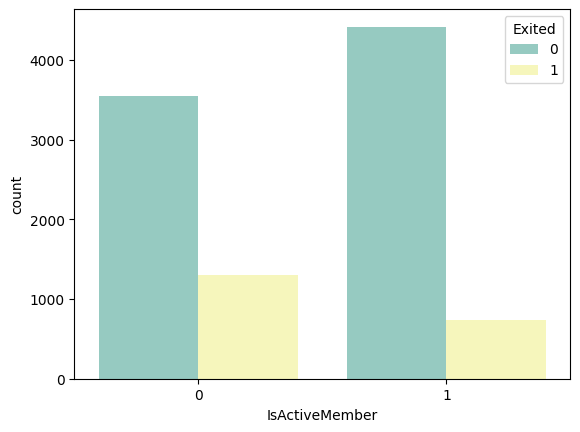

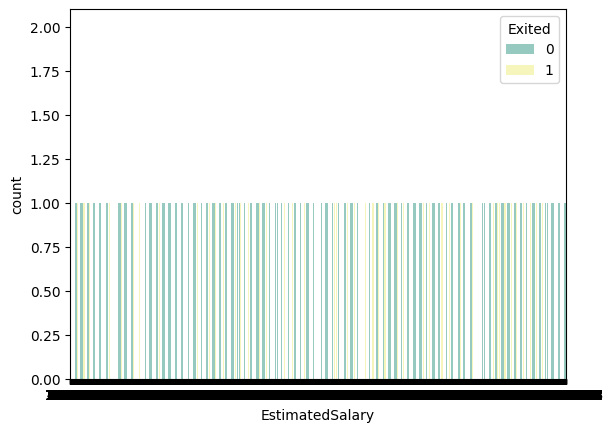

In [13]:
# Count Plot - Visualising the Relationship Between Each OF The Input Independent Variables and the Output Dependent Variable

input_features = ['CreditScore', 'Geography', 'Gender', 'Age', 'Tenure',
                 'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember',
                 'EstimatedSalary']

for feature in input_features:
    plt.figure()
    feature_count_plot = sns.countplot(x=feature, data=raw_data, hue='Exited', palette="Set3")

### Scatter Plot - Visualising the Relationship Between Each OF The Input Independent Variables and the Output Dependent Variable

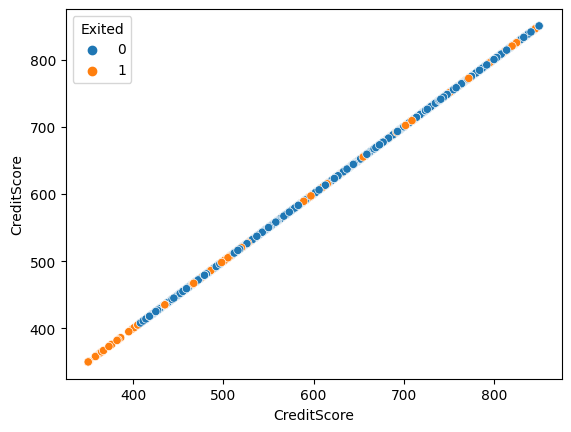

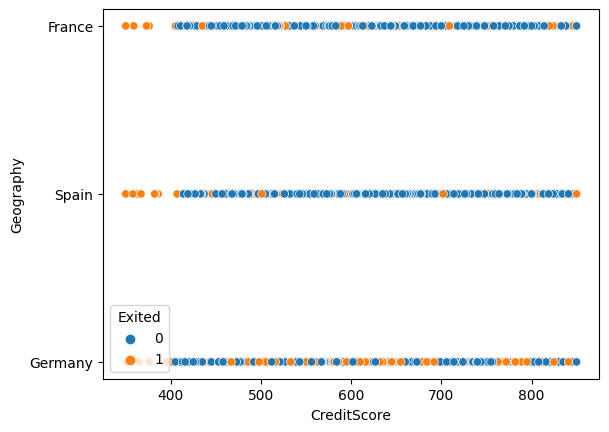

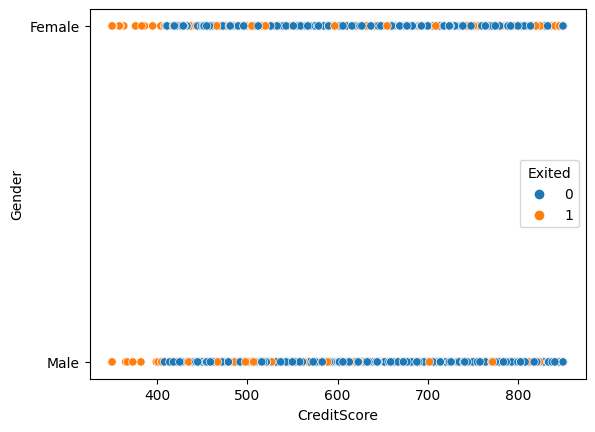

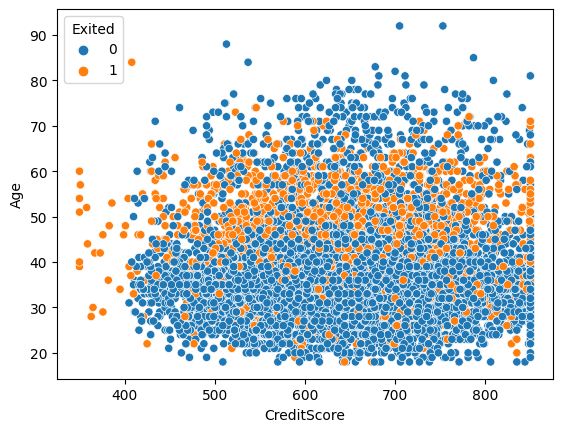

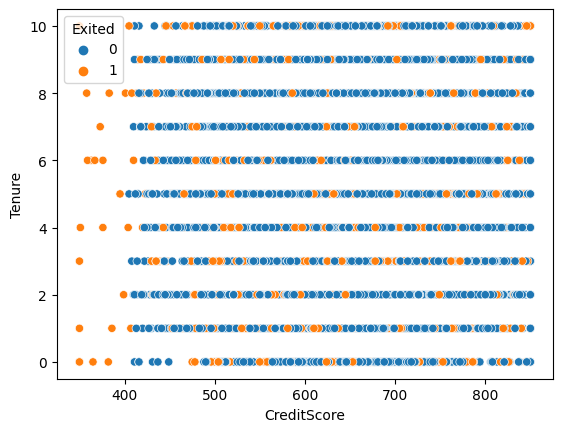

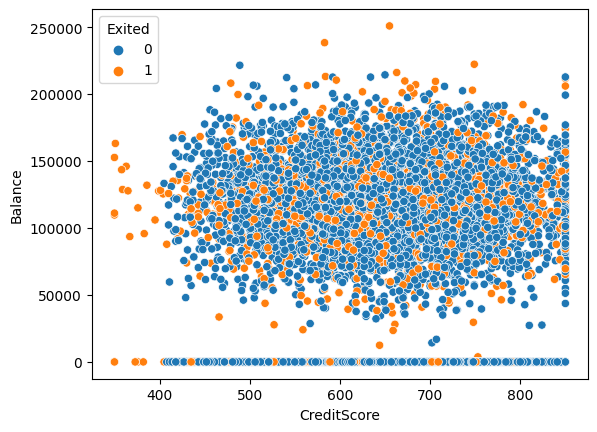

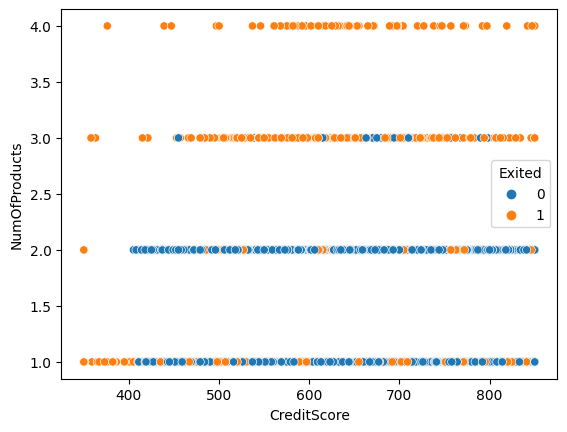

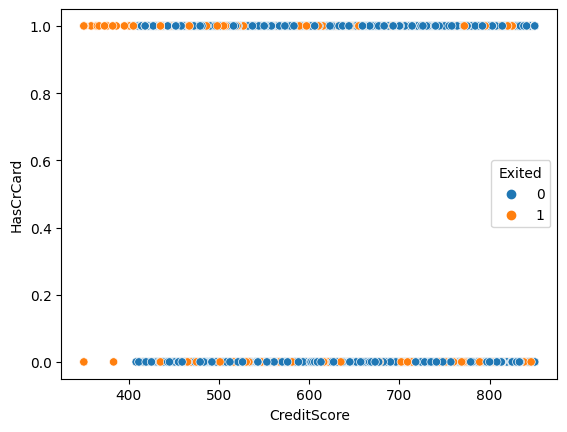

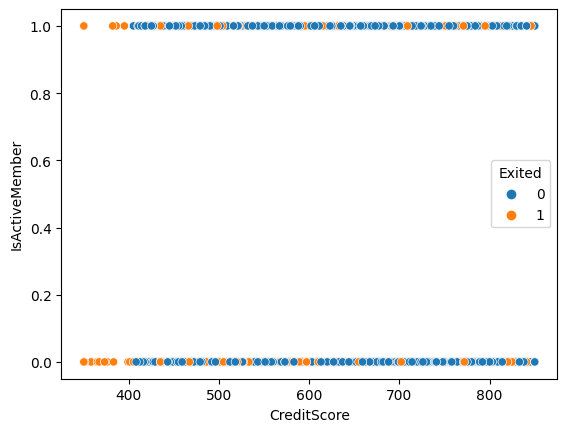

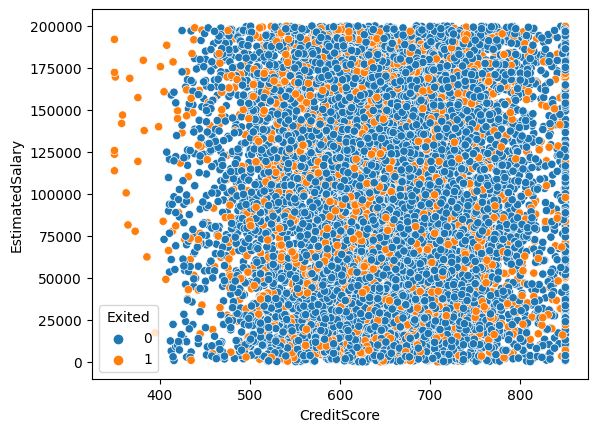

In [14]:
# Scatter Plot - Visualising the Relationship Between Each OF The Input Independent Variables and the Output Dependent Variable

input_features = ['CreditScore', 'Geography', 'Gender', 'Age', 'Tenure',
                 'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember',
                 'EstimatedSalary']

# Input Variable 'CreditScore'

for feature in input_features:
    plt.figure()
    feature_scatter_plot_1 = sns.scatterplot(data=raw_data, x='CreditScore', y=feature, hue='Exited')

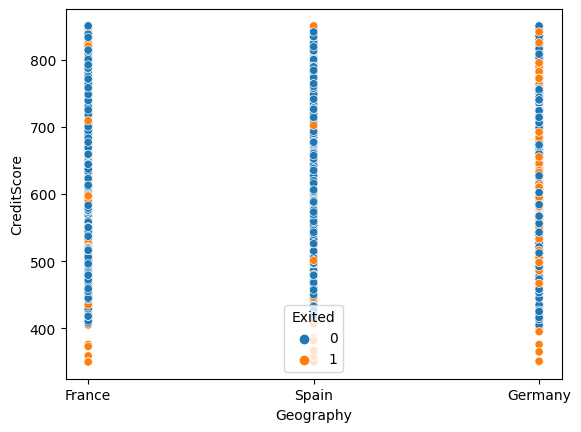

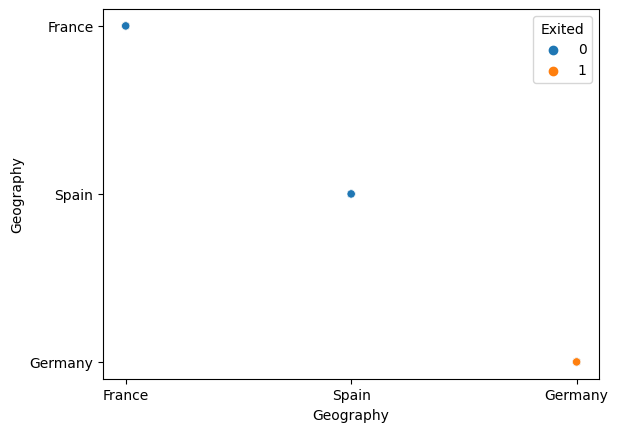

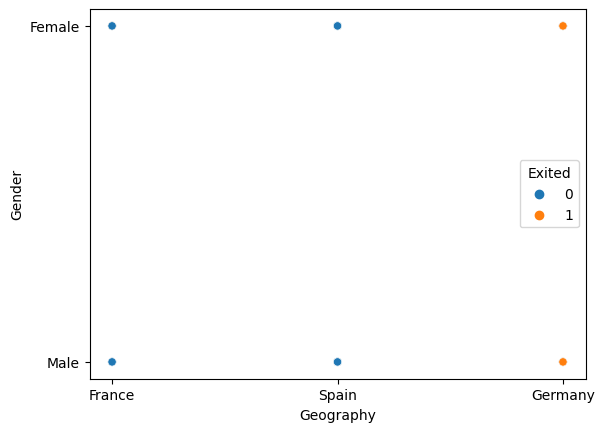

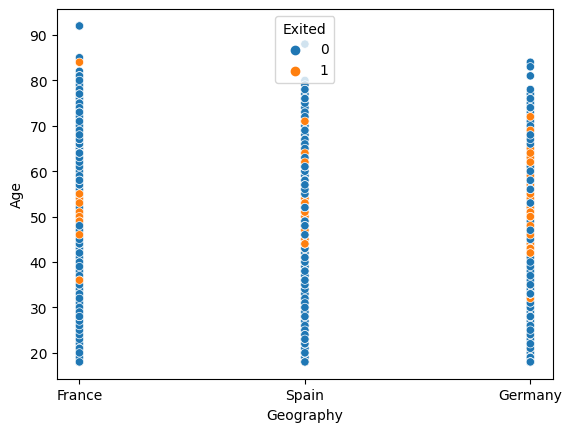

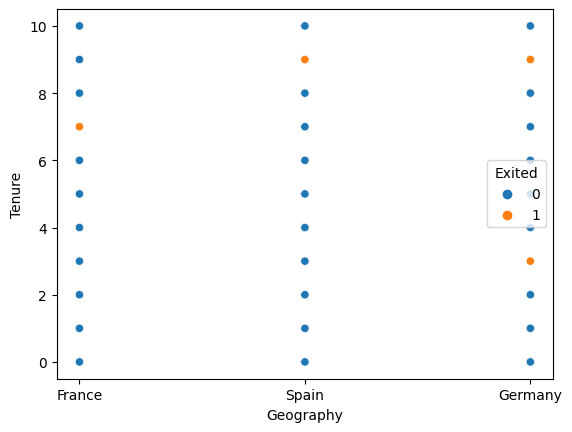

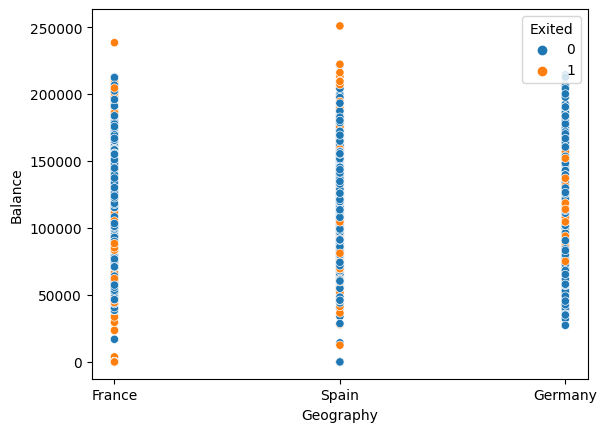

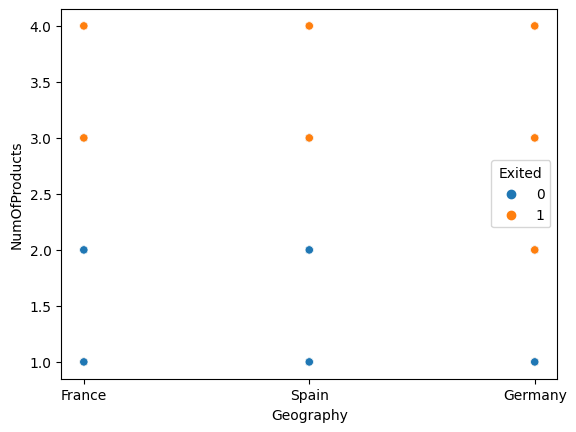

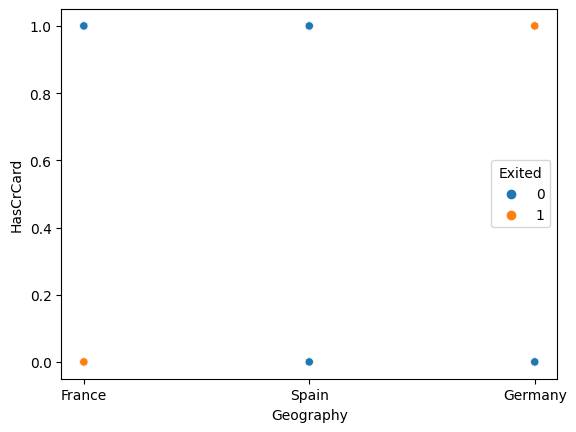

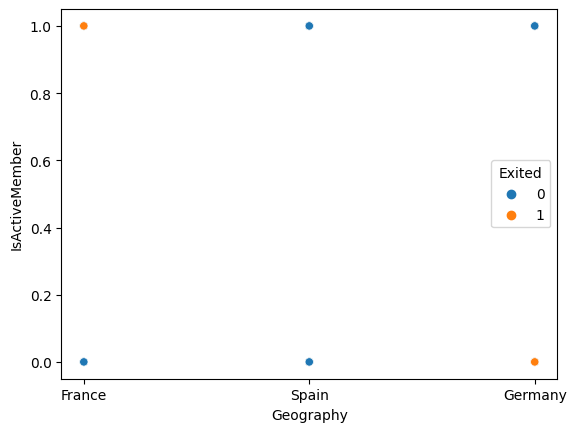

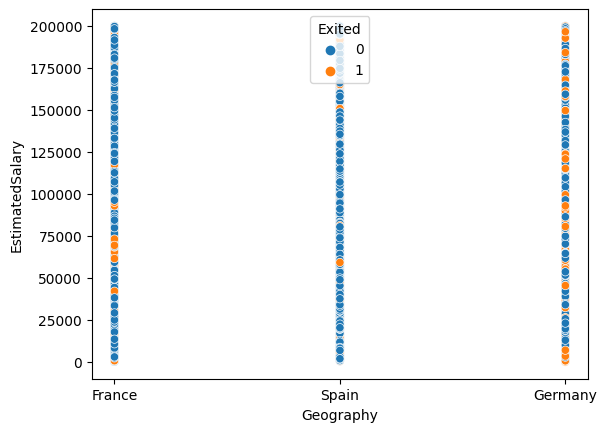

In [15]:
# Input Variable 'Geography'

for feature in input_features:
    plt.figure()
    feature_scatter_plot_2 = sns.scatterplot(data=raw_data, x='Geography', y=feature, hue='Exited')

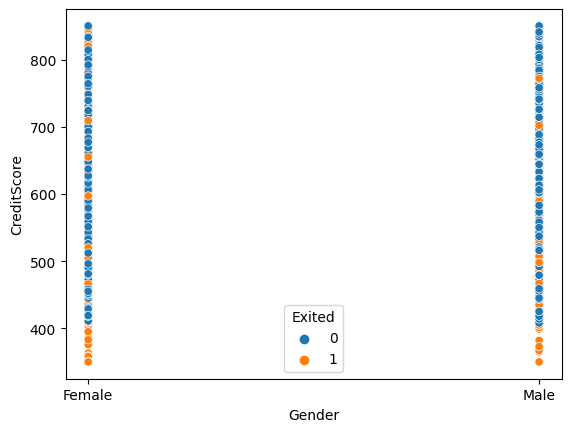

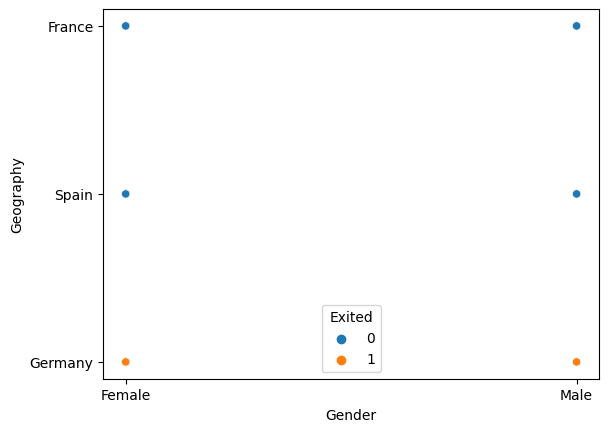

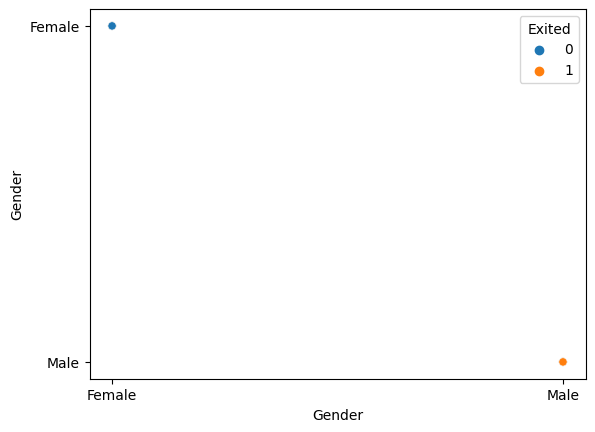

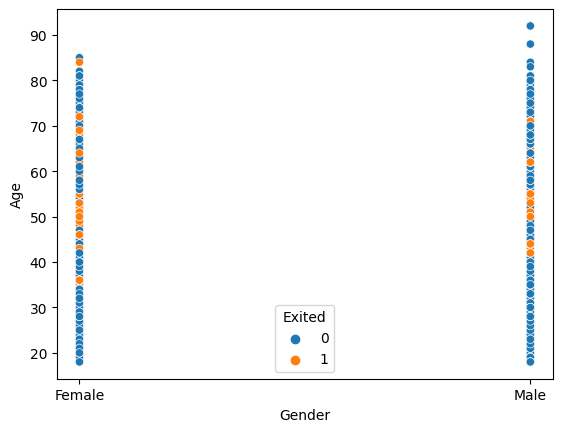

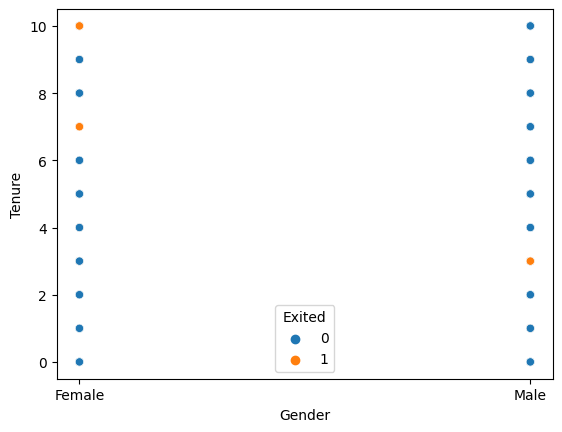

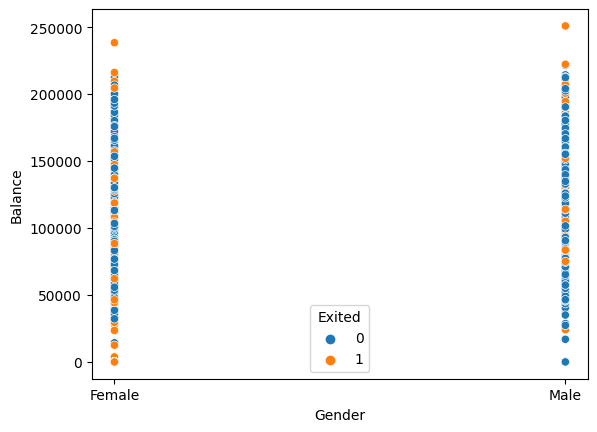

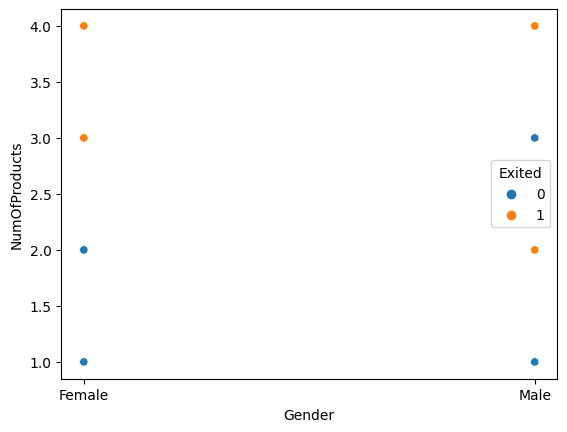

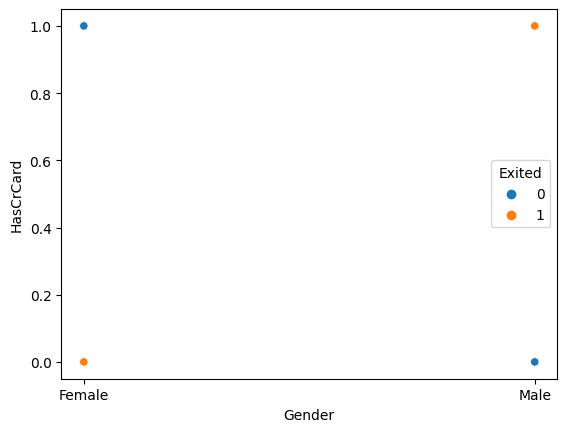

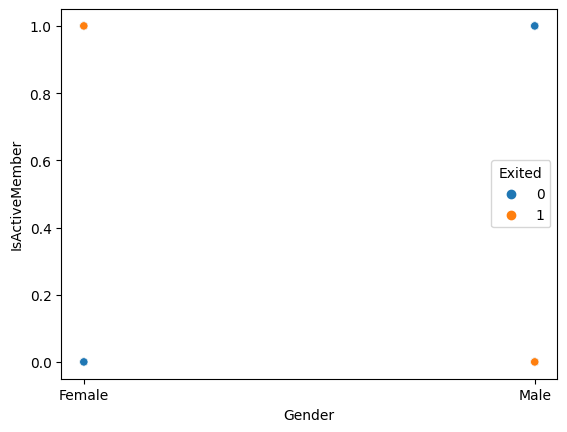

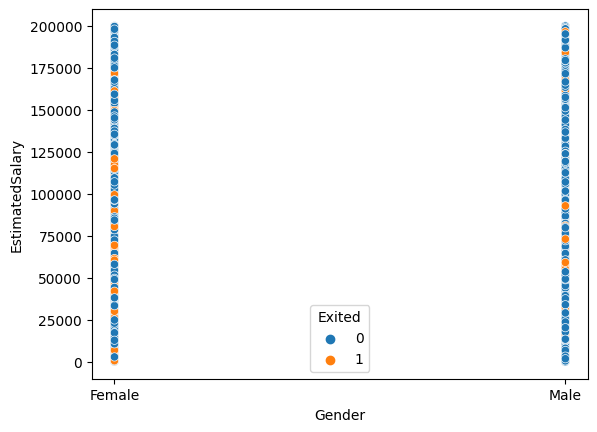

In [16]:
# Input Variable 'Gender'

for feature in input_features:
    plt.figure()
    feature_scatter_plot_3 = sns.scatterplot(data=raw_data, x='Gender', y=feature, hue='Exited')

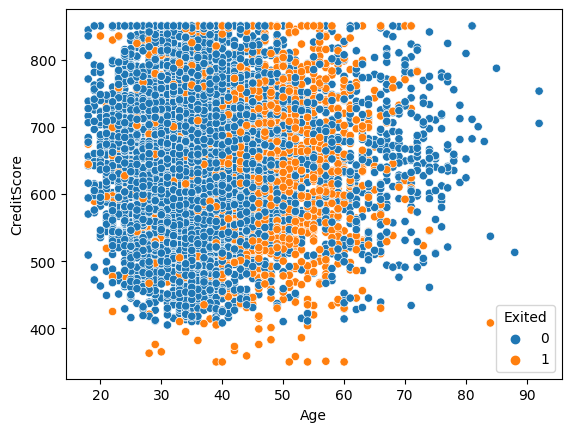

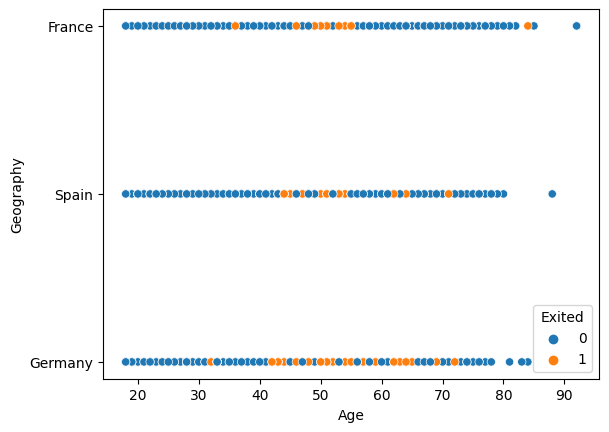

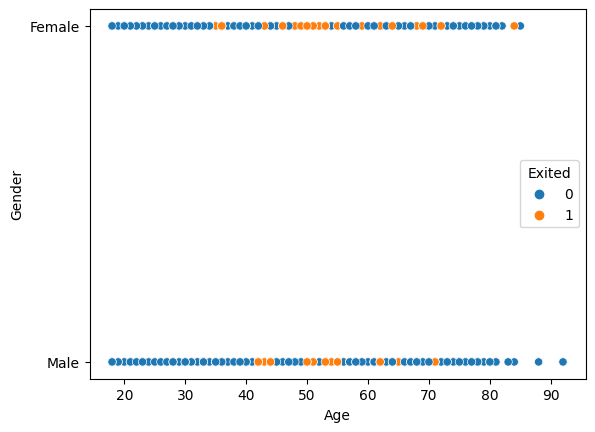

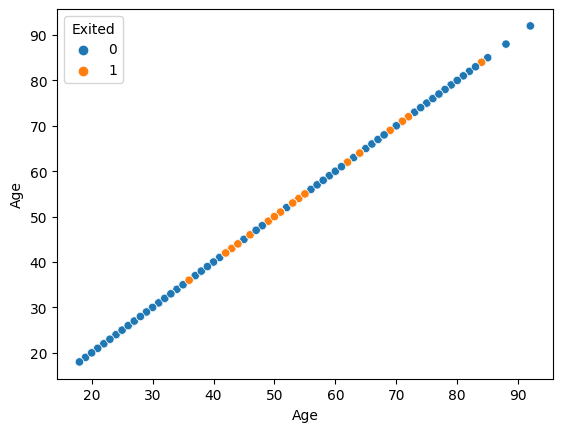

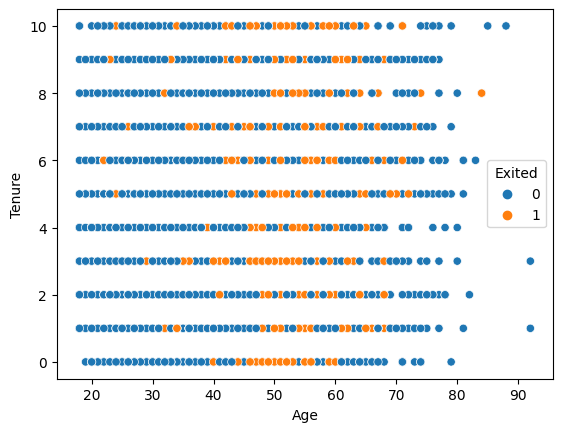

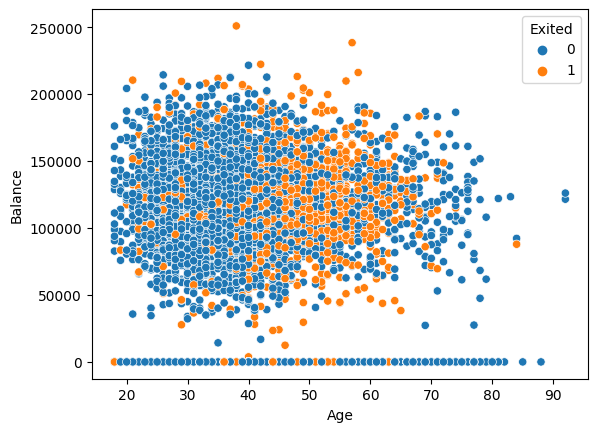

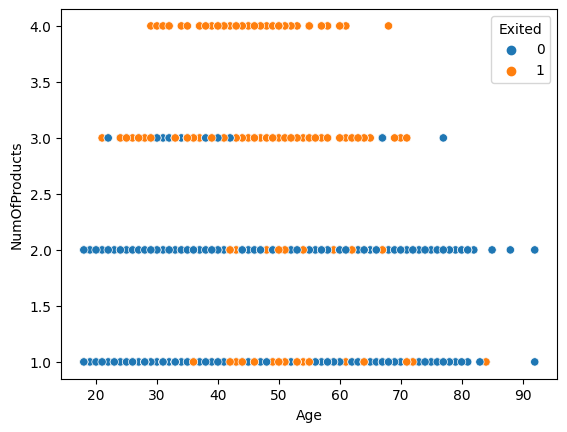

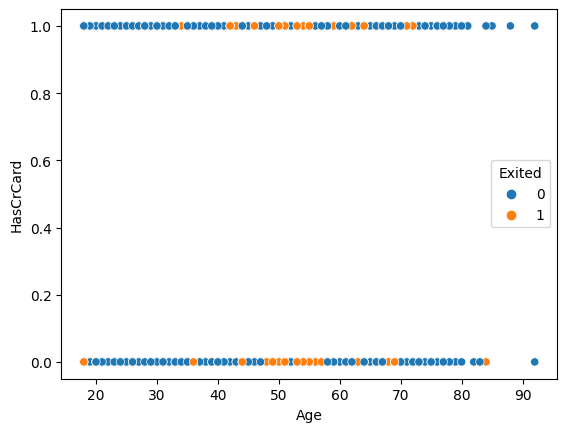

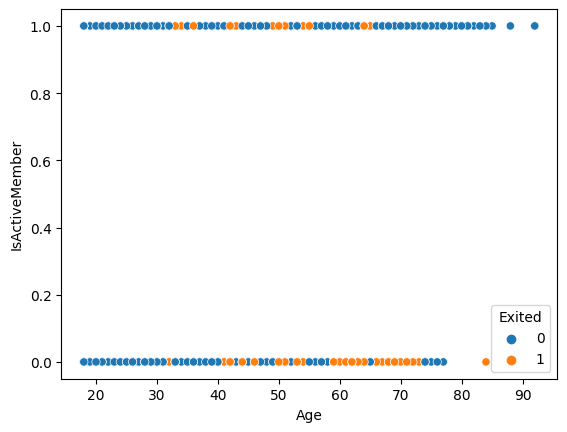

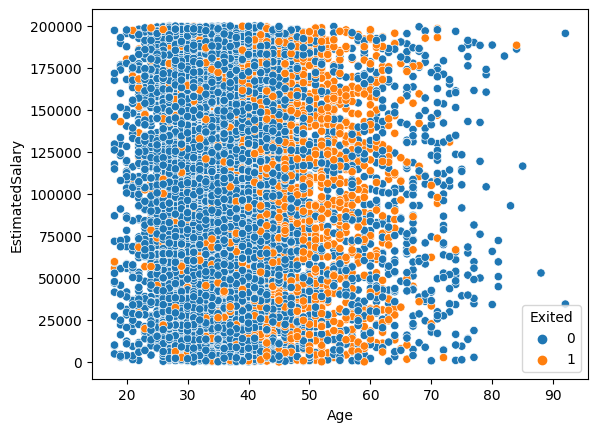

In [17]:
# Input Variable 'Age'

for feature in input_features:
    plt.figure()
    feature_scatter_plot_4 = sns.scatterplot(data=raw_data, x='Age', y=feature, hue='Exited')

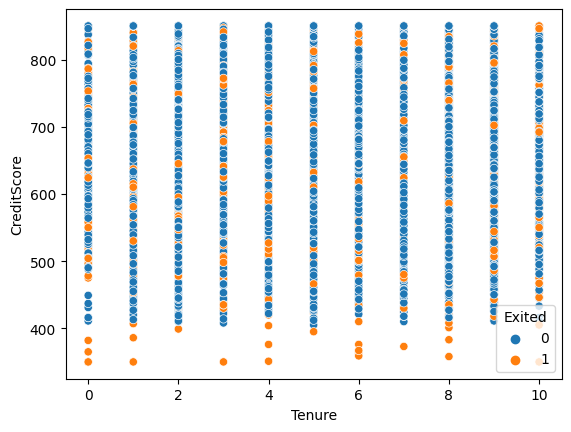

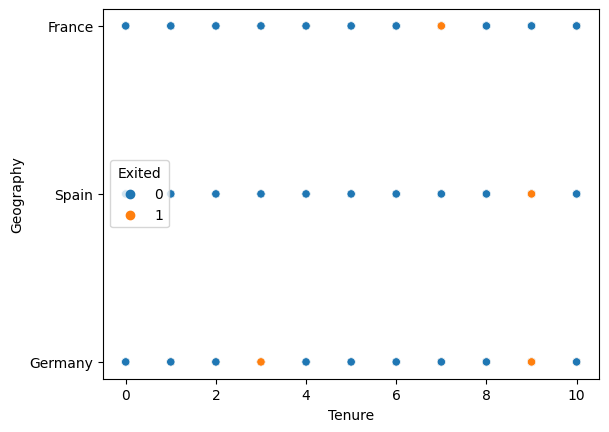

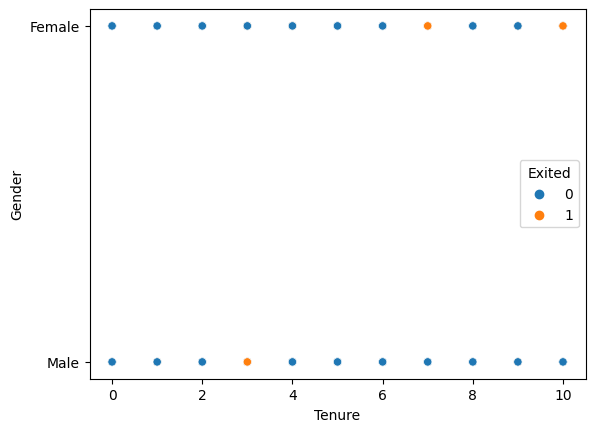

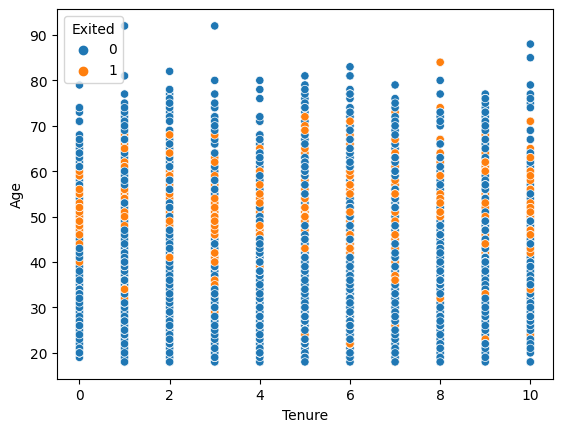

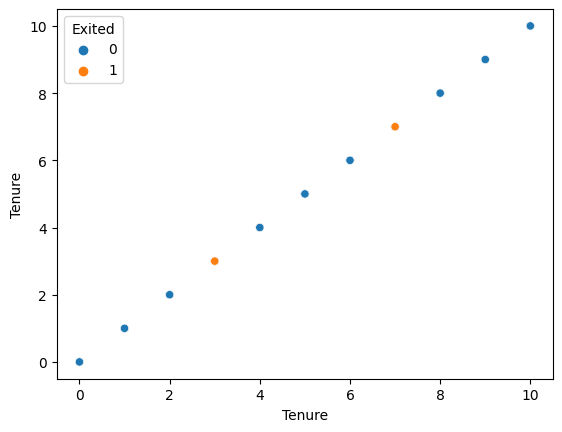

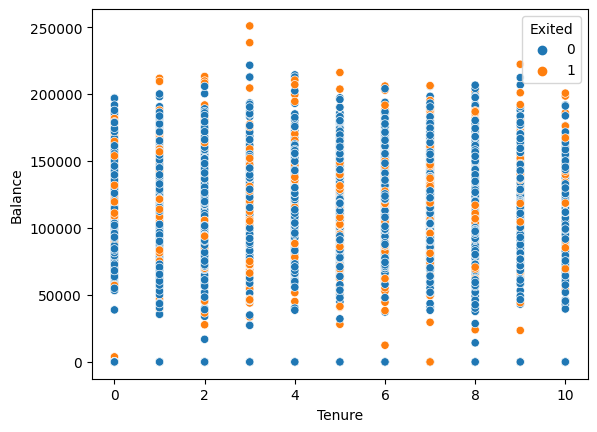

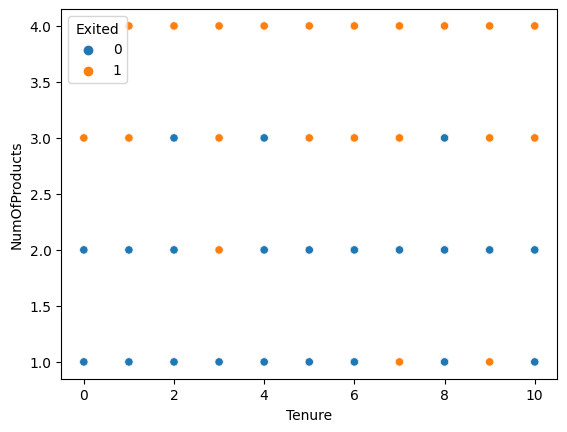

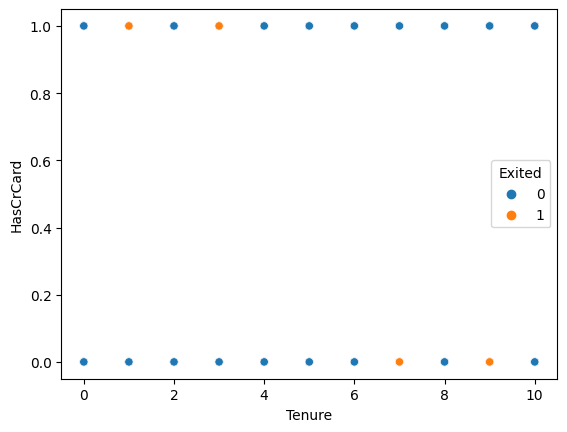

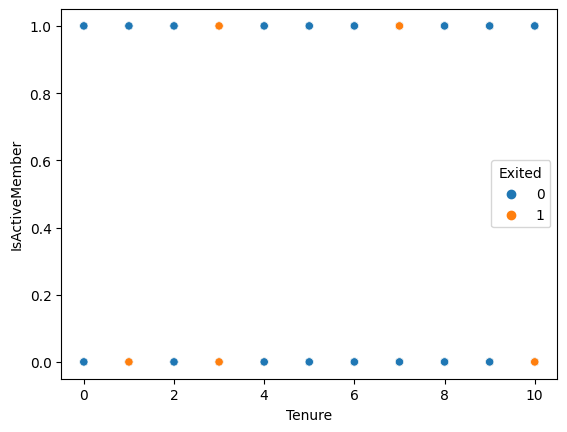

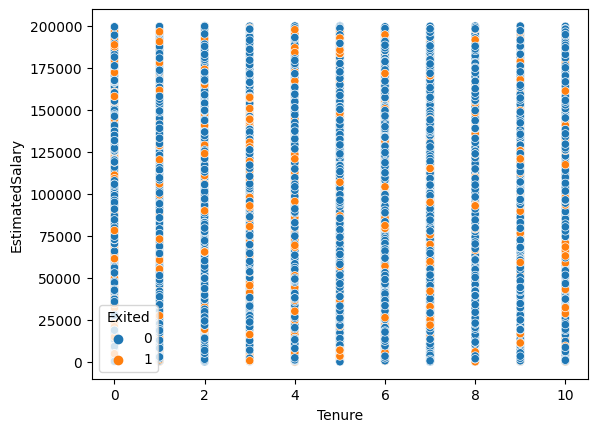

In [18]:
# Input Variable 'Tenure'

for feature in input_features:
    plt.figure()
    feature_scatter_plot_5 = sns.scatterplot(data=raw_data, x='Tenure', y=feature, hue='Exited')

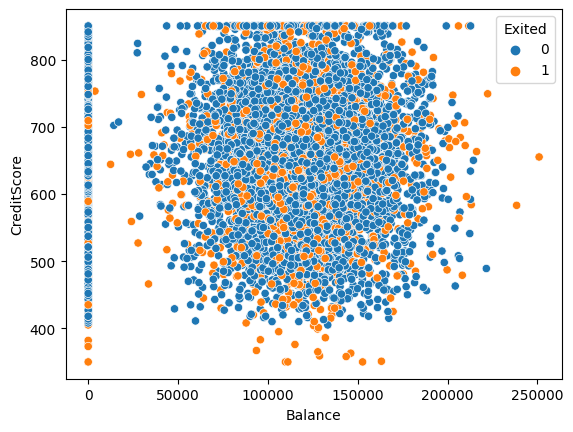

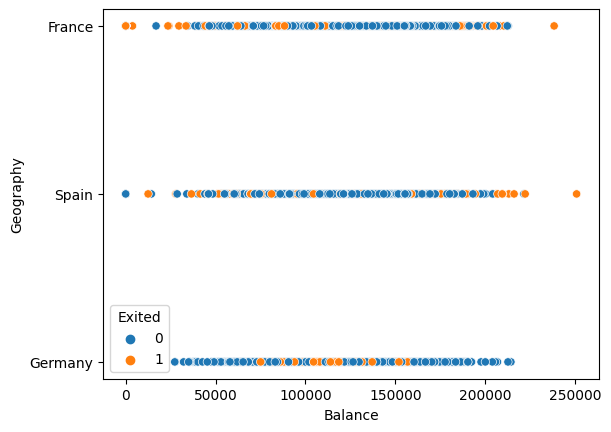

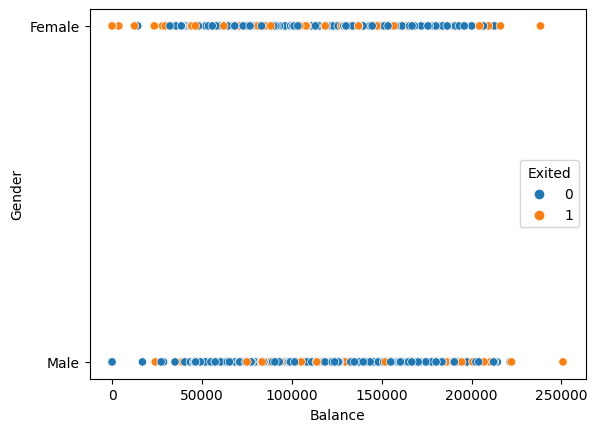

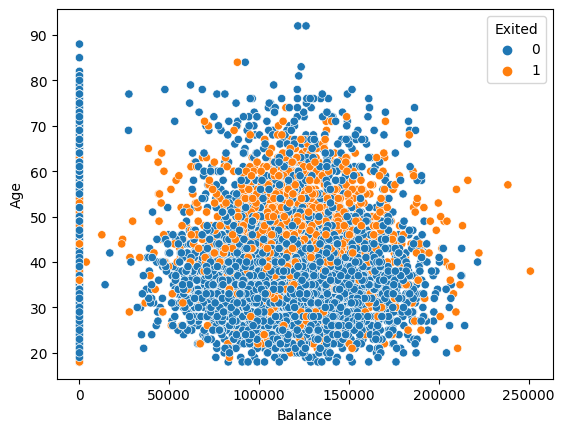

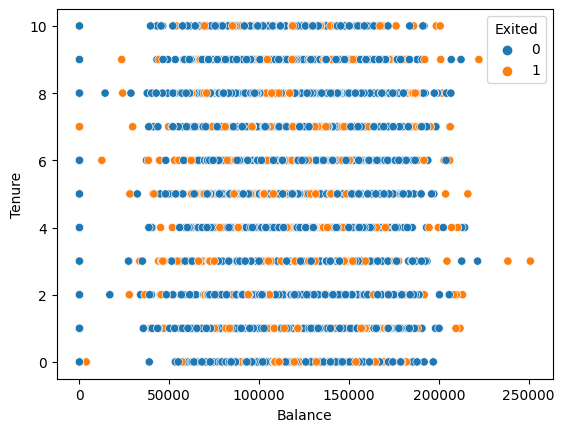

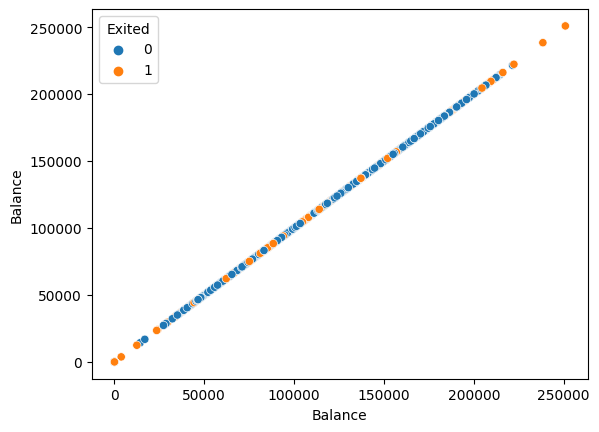

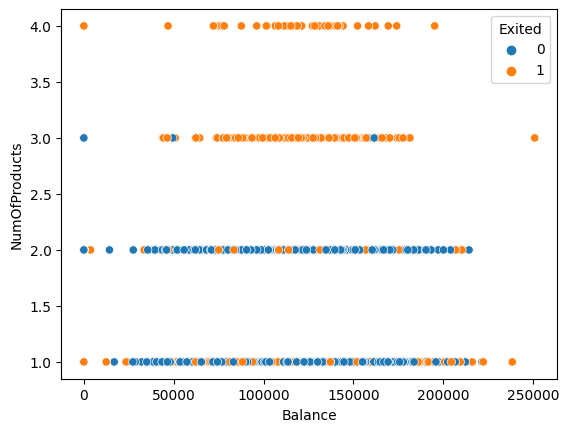

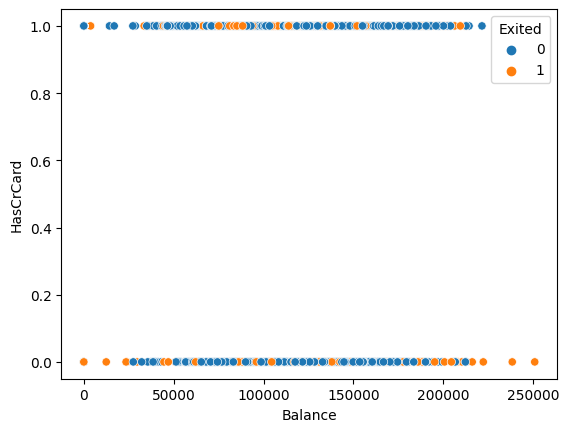

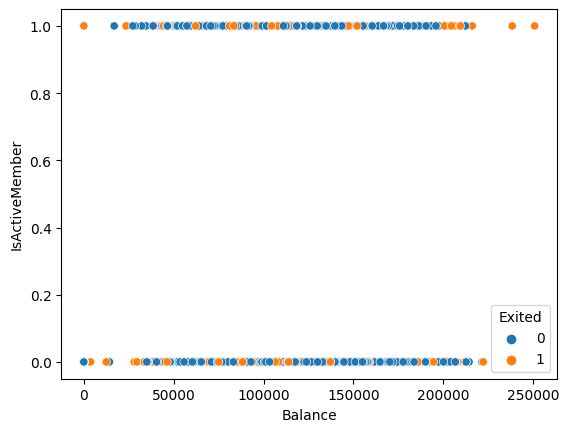

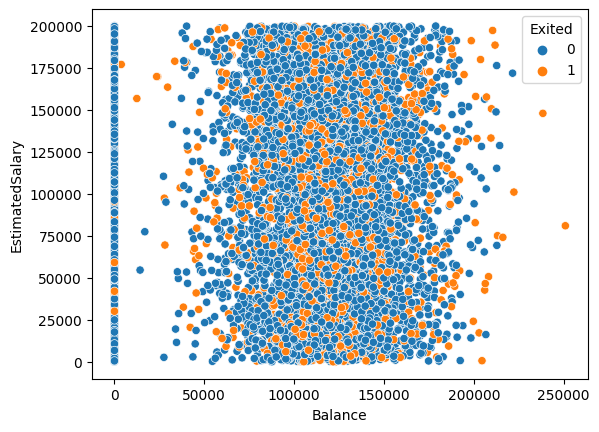

In [19]:
# Input Variable 'Balance'

for feature in input_features:
    plt.figure()
    feature_scatter_plot_6 = sns.scatterplot(data=raw_data, x='Balance', y=feature, hue='Exited')

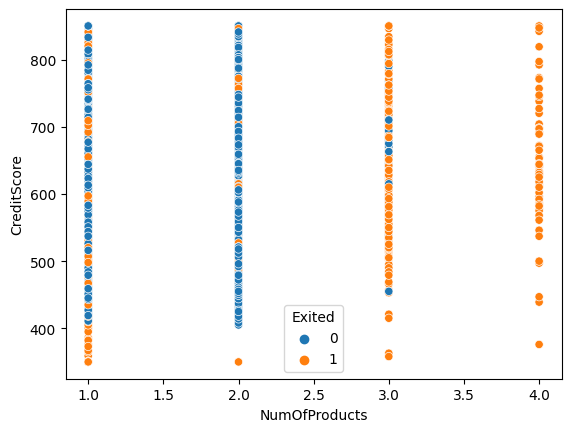

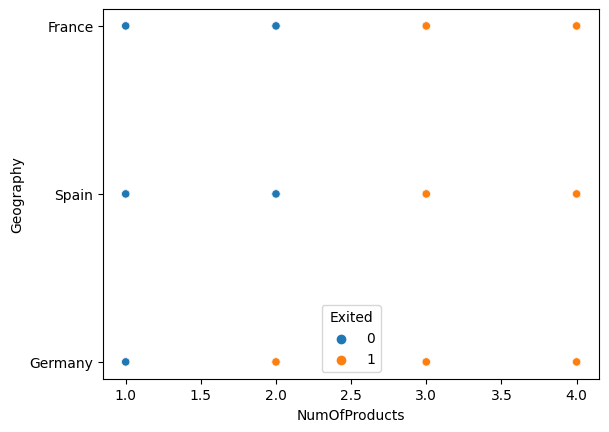

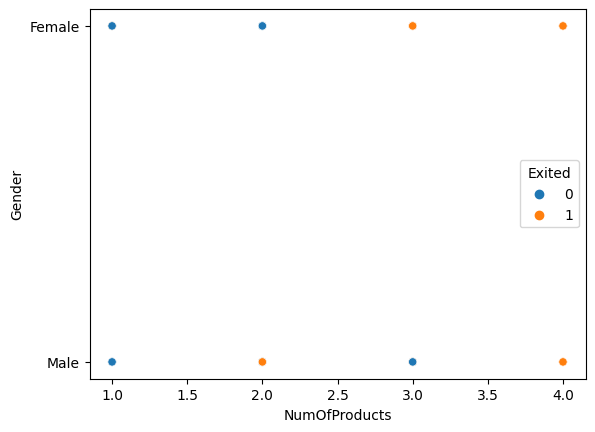

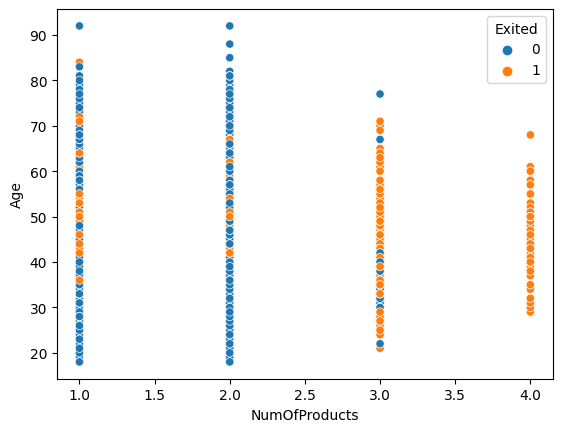

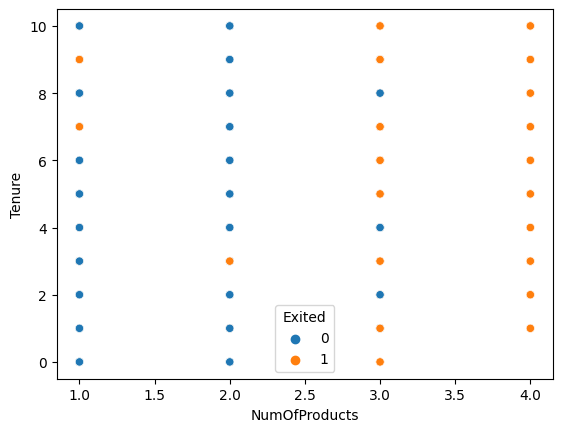

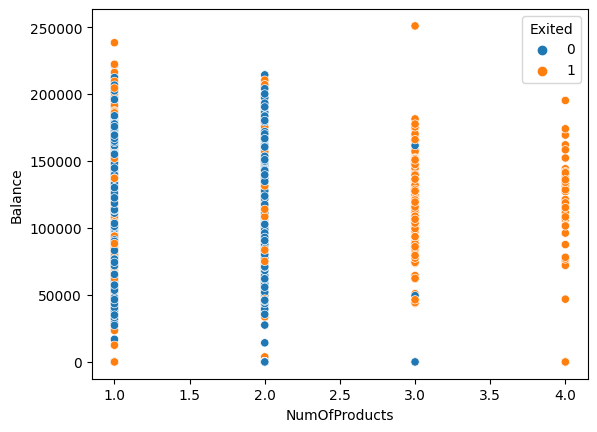

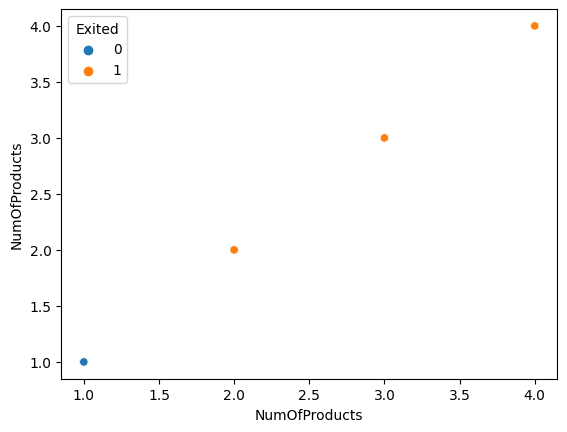

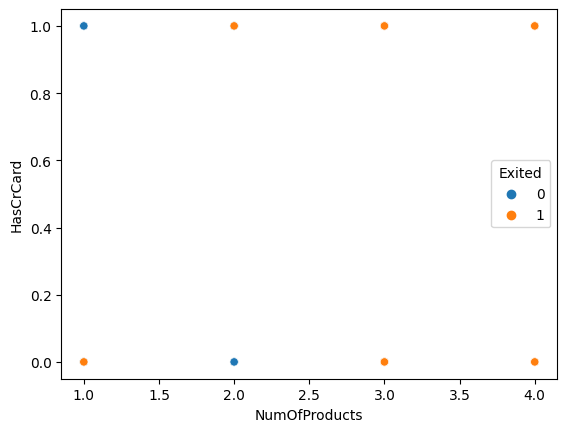

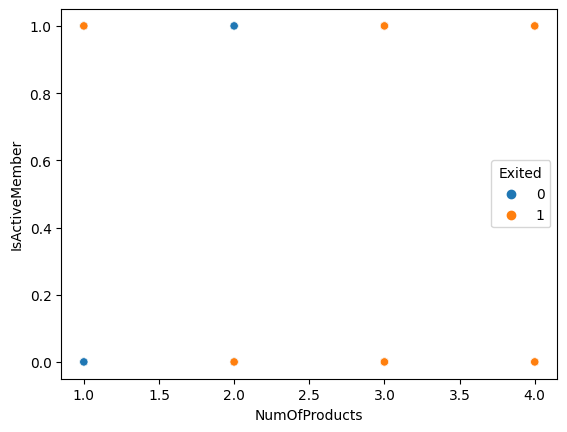

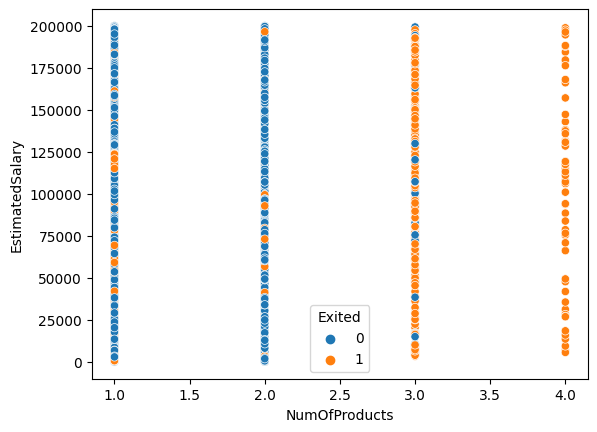

In [20]:
# Input Variable 'NumOfProducts'

for feature in input_features:
    plt.figure()
    feature_scatter_plot_7 = sns.scatterplot(data=raw_data, x='NumOfProducts', y=feature, hue='Exited')

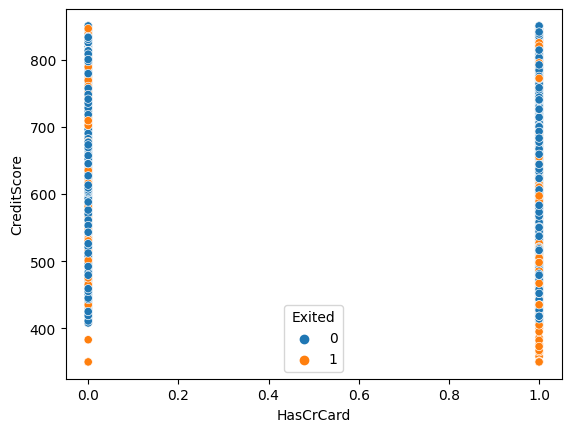

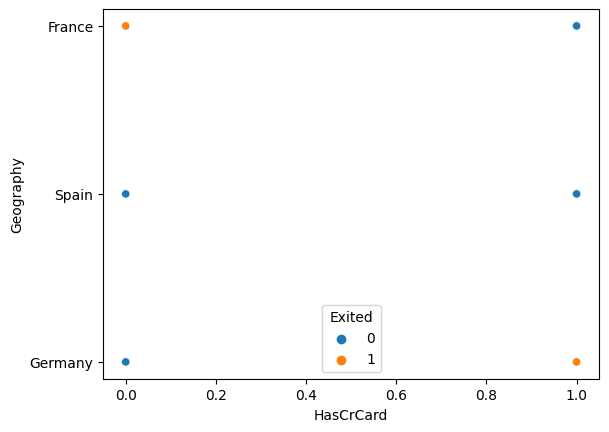

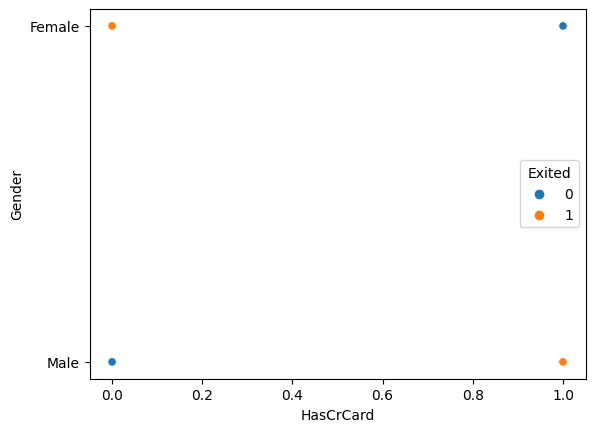

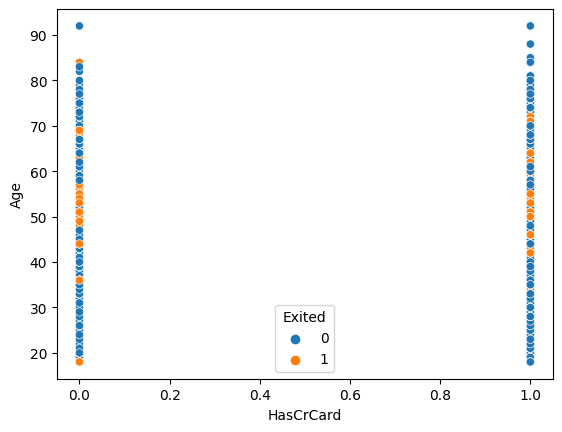

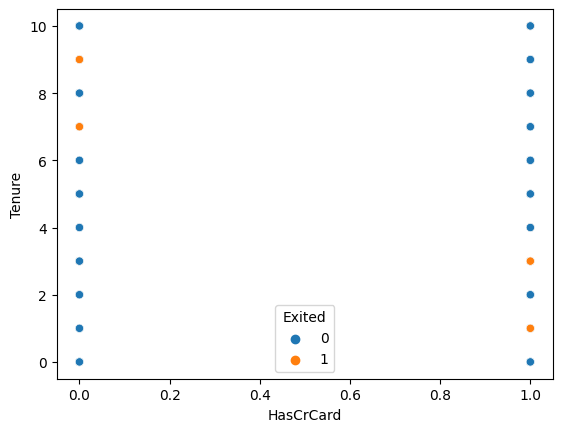

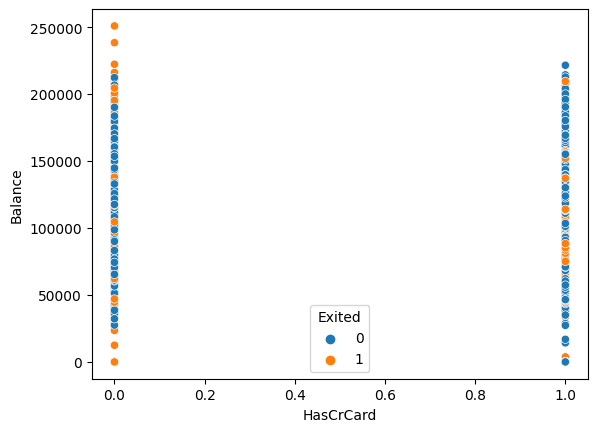

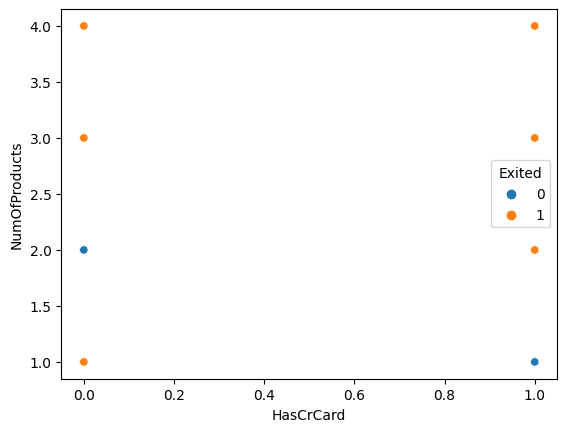

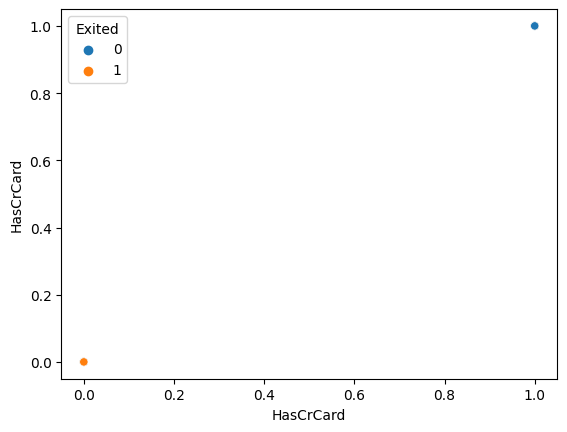

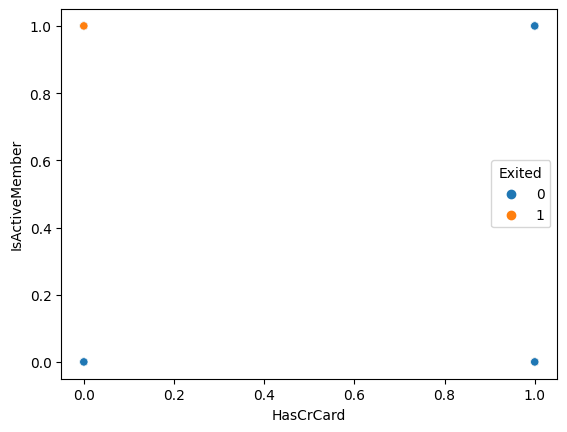

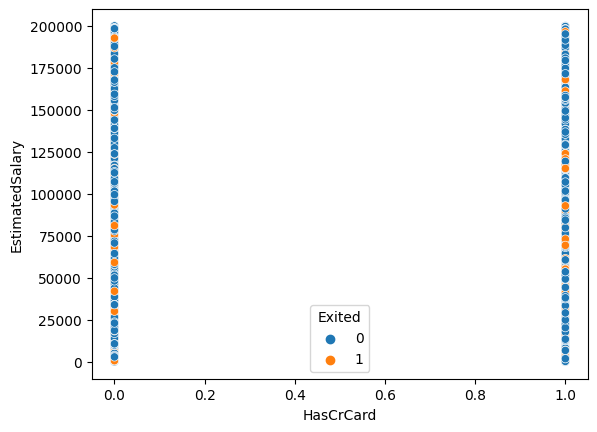

In [21]:
# Input Variable 'HasCrCard'

for feature in input_features:
    plt.figure()
    feature_scatter_plot_8 = sns.scatterplot(data=raw_data, x='HasCrCard', y=feature, hue='Exited')

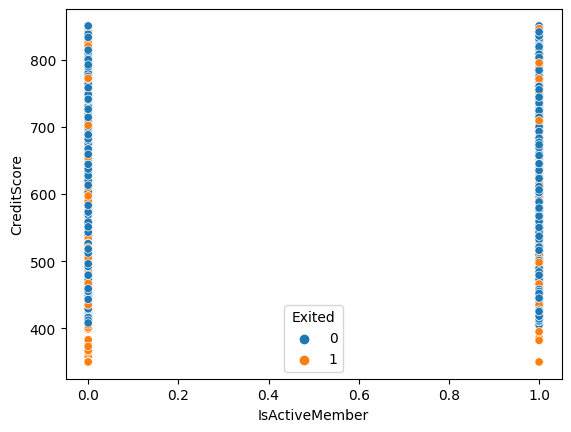

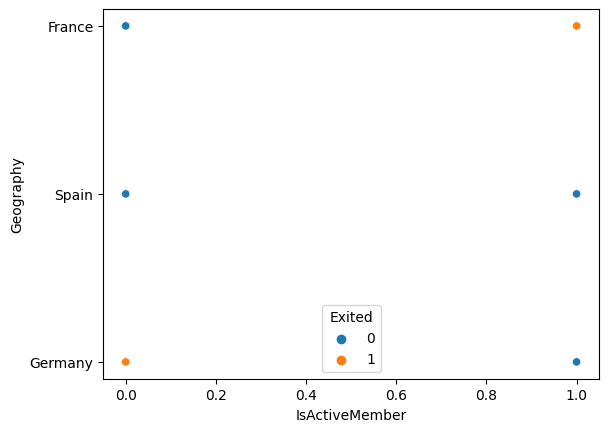

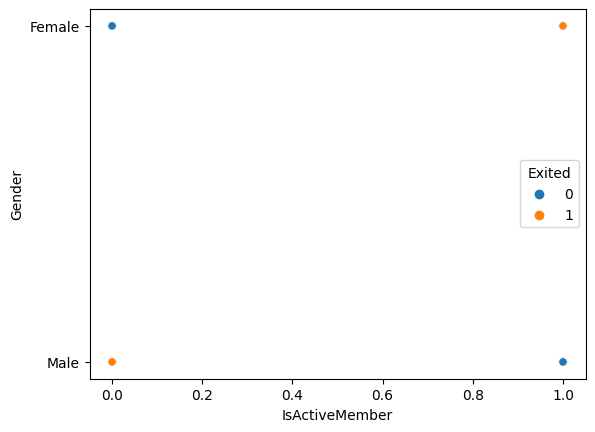

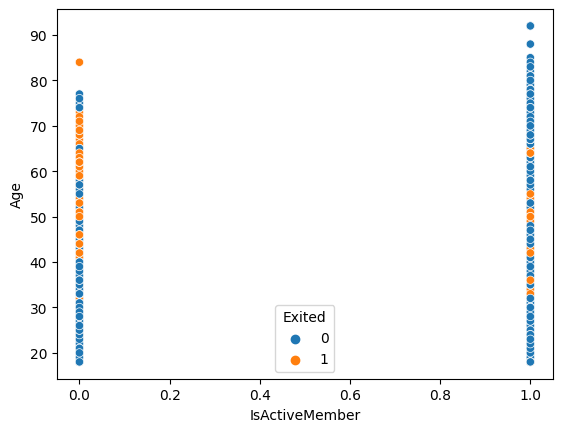

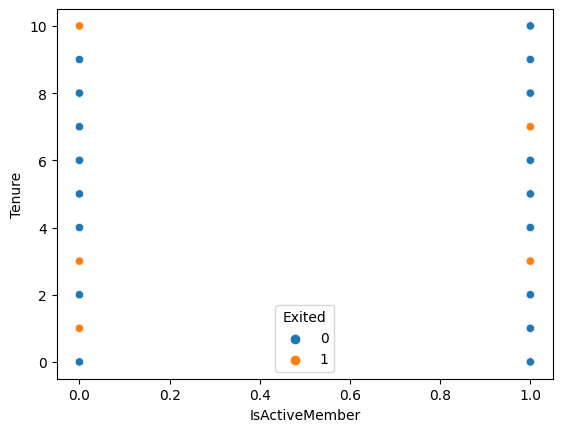

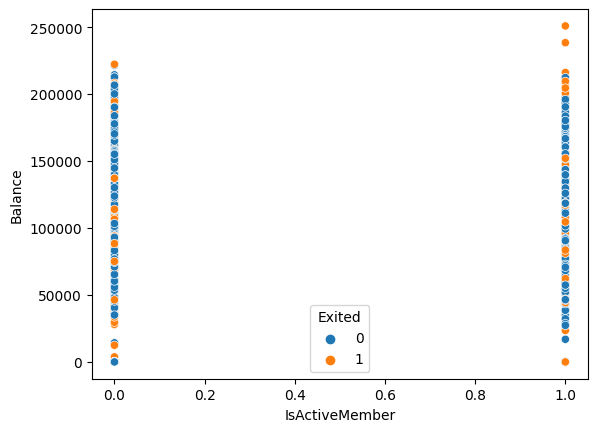

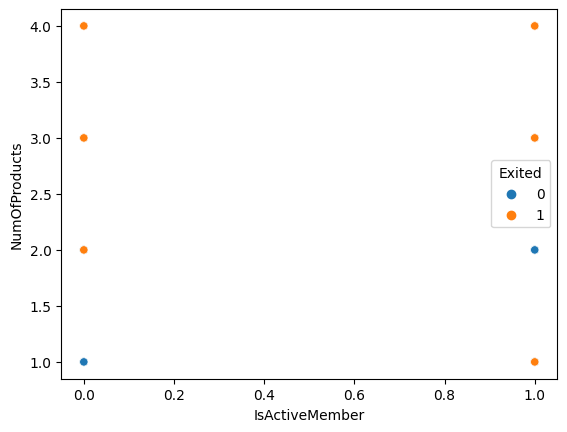

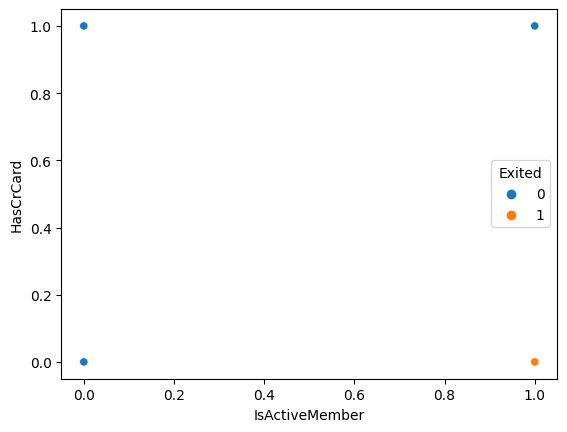

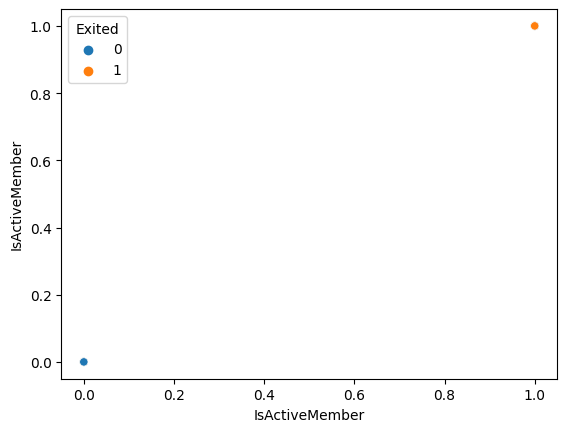

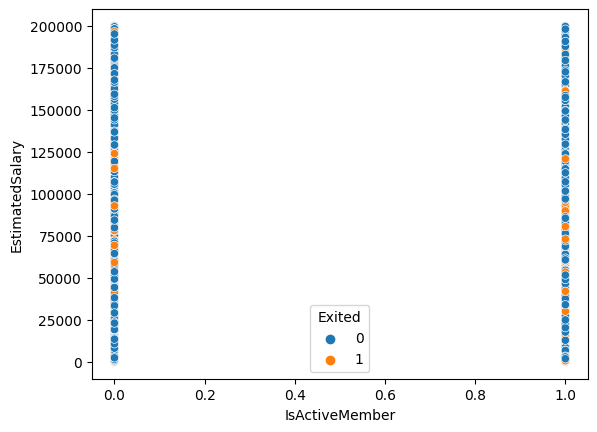

In [22]:
# Input Variable 'IsActiveMember'

for feature in input_features:
    plt.figure()
    feature_scatter_plot_9 = sns.scatterplot(data=raw_data, x='IsActiveMember', y=feature, hue='Exited')

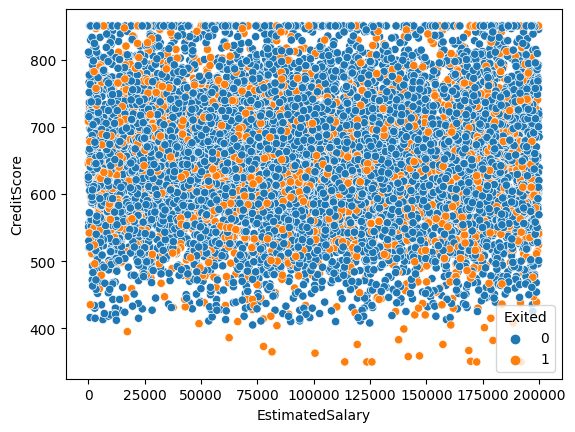

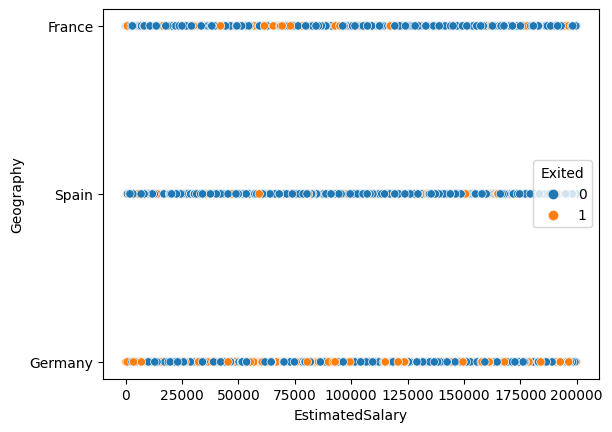

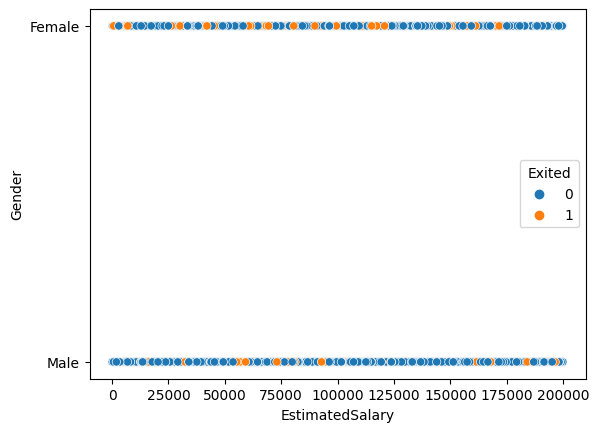

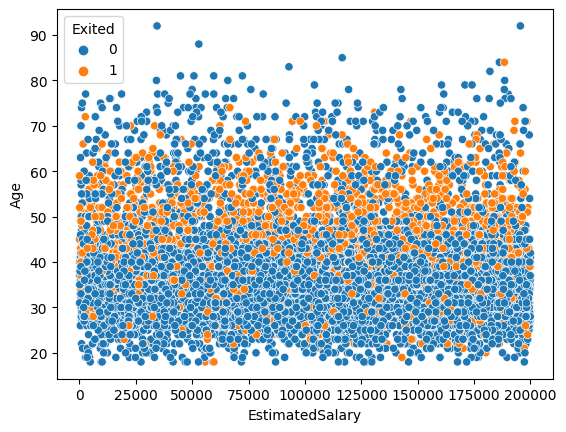

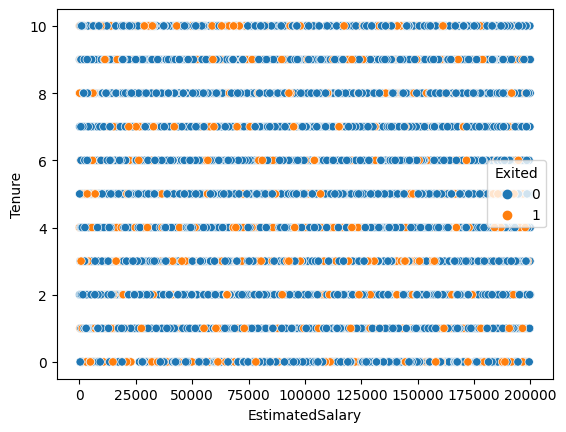

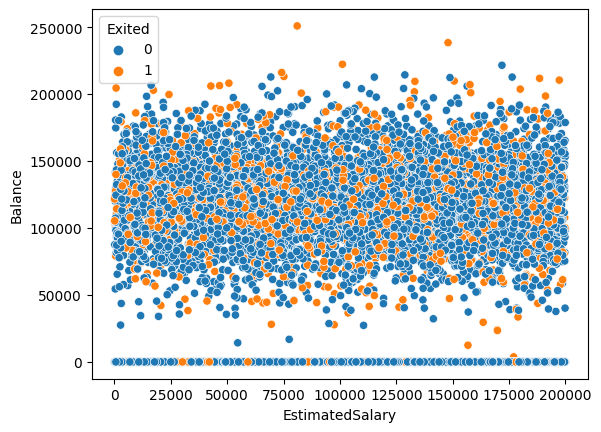

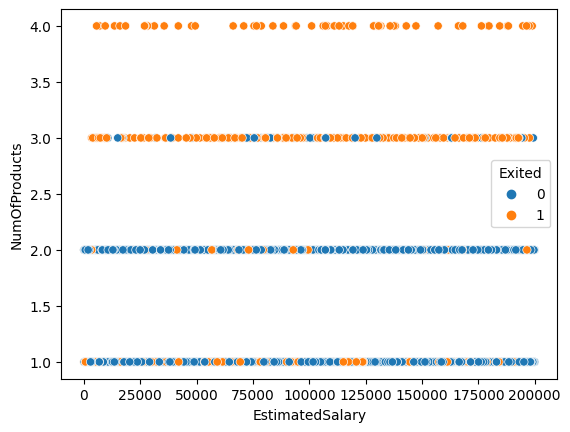

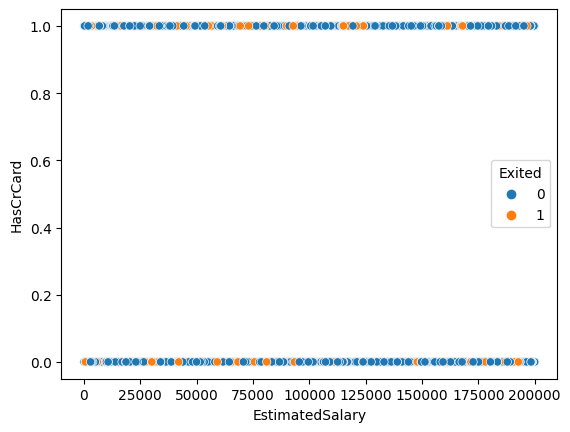

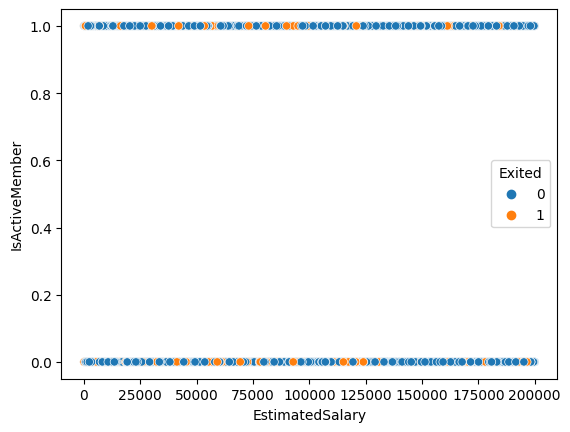

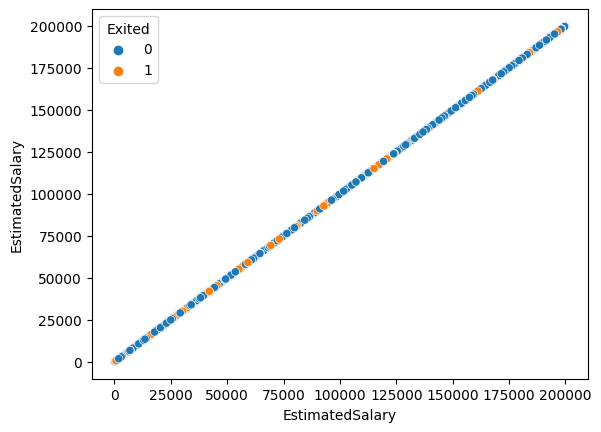

In [23]:
# Input Variable 'EstimatedSalary'

for feature in input_features:
    plt.figure()
    feature_scatter_plot_10 = sns.scatterplot(data=raw_data, x='EstimatedSalary', y=feature, hue='Exited')

## 5. DATA PRE-PROCESSING

In [24]:
# Converting the Categorical Variables into Numeric One-Hot Encoded Variables for Decision Tree IDE Model Training Purposes

raw_data_pp = pd.get_dummies(raw_data, columns=['Geography', 'Gender', 'HasCrCard', 'IsActiveMember'])

print("Execution Completed")

Execution Completed


In [25]:
# Verifying the Columns of the Pre-processed Raw Data Frame after Applying One-Hot Encoding Method

raw_data_pp.head()

,CreditScore,Age,Tenure,Balance,NumOfProducts,EstimatedSalary,Exited,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male,HasCrCard_0,HasCrCard_1,IsActiveMember_0,IsActiveMember_1
0,619,42,2,0.00,1,101348.88,1,1,0,0,1,0,0,1,0,1
1,608,41,1,83807.86,1,112542.58,0,0,0,1,1,0,1,0,0,1
2,502,42,8,159660.80,3,113931.57,1,1,0,0,1,0,0,1,1,0
3,699,39,1,0.00,2,93826.63,0,1,0,0,1,0,1,0,1,0
4,850,43,2,125510.82,1,79084.10,0,0,0,1,1,0,0,1,0,1


In [26]:
# Verifying the Shape of the Pre-processed Raw Data Frame after Applying One-Hot Encoding Method

raw_data_pp.shape

(10000, 16)

In [27]:
# Normalising the Continuous Variables Columns to Scale to a Value Between 0 and 1 for Decision Tree IDE Model Training Purposes

norm_scale_features = ['CreditScore', 'Age', 'Balance','EstimatedSalary']

norm_scale = MinMaxScaler()

raw_data_pp[norm_scale_features] = norm_scale.fit_transform(raw_data_pp[norm_scale_features])

print("Scaling is Completed")

Scaling is Completed


In [28]:
# Verifying all the Columns of the Final Pre-processed Raw Data Frame after Applying the Scaling Method

raw_data_pp.head()

,CreditScore,Age,Tenure,Balance,NumOfProducts,EstimatedSalary,Exited,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male,HasCrCard_0,HasCrCard_1,IsActiveMember_0,IsActiveMember_1
0,0.538,0.324324,2,0.000000,1,0.506735,1,1,0,0,1,0,0,1,0,1
1,0.516,0.310811,1,0.334031,1,0.562709,0,0,0,1,1,0,1,0,0,1
2,0.304,0.324324,8,0.636357,3,0.569654,1,1,0,0,1,0,0,1,1,0
3,0.698,0.283784,1,0.000000,2,0.469120,0,1,0,0,1,0,1,0,1,0
4,1.000,0.337838,2,0.500246,1,0.395400,0,0,0,1,1,0,0,1,0,1


In [29]:
# Verifying the Shape of the Pre-processed Raw Data Frame after Applying the Scaling Method

raw_data_pp.shape

(10000, 16)

## 6. DATA SPLIT AS TRAIN DATA AND VALIDATION DATA

In [30]:
# Defining the Input and the Target Vectors for Decision Tree IDE Model Training Purposes

# Input (Independent) Features/Attributes
X = raw_data_pp.drop('Exited', axis=1).values

# Output (Dependent) Target Attribute
y = raw_data_pp['Exited'].values

print("Execution Completed")

Execution Completed


In [31]:
# Verifying the Shape of the Input and the Output Vectors

print("The Input Vector Shape is {}".format(X.shape))
print("The Output Vector Shape is {}".format(y.shape))

The Input Vector Shape is (10000, 15)
The Output Vector Shape is (10000,)


In [32]:
# Splitting the Data Between Train and Validation Data

X_train, X_validate, y_train, y_validate = train_test_split(X, y, train_size=0.9, test_size=0.1, random_state=1)

print("Execution Completed")

Execution Completed


In [33]:
# Verifying the Shape of the Train and the Validation Data

print("Input Train: {}".format(X_train.shape))
print("Output Train: {}\n".format(y_train.shape))
print("Input Validation: {}".format(X_validate.shape))
print("Output Validation: {}".format(y_validate.shape))

Input Train: (9000, 15)
Output Train: (9000,)

Input Validation: (1000, 15)
Output Validation: (1000,)


## 7. TRAINING THE DECISION TREE - ID3 (ITERATIVE DICHOTOMISER) ALGORITHM

In [34]:
# Creating an Instance of the Decision Tree Classifier Model
decision_tree_model = DecisionTreeClassifier(criterion='entropy', max_depth=2, random_state=10)

print("Model Training Started.....")

# Training the Decision Tree Classifier Model using ID3 Algorithm
decision_tree_model.fit(X_train, y_train)

print("Model Training Completed.....")

Model Training Started.....
Model Training Completed.....


## 8. DECISION TREE GRAPHICAL REPRESENTATION AND VISUALISATION

### Method 1 : Visualising the Decision Tree using export_graphviz() Function

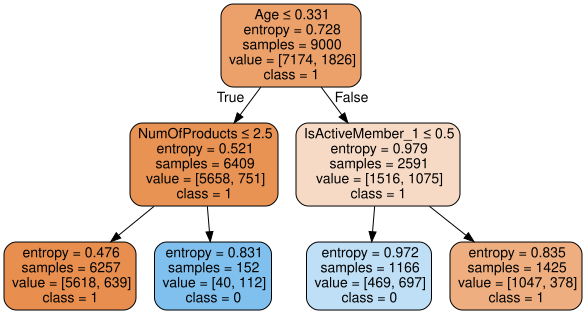

In [35]:
# Method 1 : Visualising the Decision Tree Using export_graphviz() Function

# Defining the Decision Tree Graph Data
graph_data = tree.export_graphviz(decision_tree_model, out_file=None,
                                  feature_names=raw_data_pp.drop('Exited', axis=1).columns,
                                  class_names=raw_data_pp['Exited'].unique().astype(str),
                                  filled=True, rounded=True, special_characters=True,
                                  impurity=True)

#graph_data

# Creating the Decision Tree for the Above Graph Data using Graphviz
decision_tree_graph = graphviz.Source(graph_data)

# Visualising the Decision Tree
decision_tree_graph

### Method 2 : Visualising the Decision Tree using graph_from_dot_data() Function

In [36]:
# Method 2 : Visualising the Decision Tree Using graph_from_dot_data() Function

# Defining the Decision Tree Graph Data
graph_data = tree.export_graphviz(decision_tree_model, out_file=None,
                                  feature_names=raw_data_pp.drop('Exited', axis=1).columns,
                                  class_names=raw_data_pp['Exited'].unique().astype(str),
                                  filled=True, rounded=True, special_characters=True,
                                  impurity=True)

#graph_data


# Creating the Decision Tree for the Above Graph Data using pydotplus
pydot_graph = pydotplus.graph_from_dot_data(graph_data)
pydot_graph.write_png('Original_Decision_Tree.png')
pydot_graph.set_size('"8,8!"')
pydot_graph.write_png('Resized_Decision_Tree.png')

pydot_graph

print("Execution Completed")

Execution Completed


### Method 3 : Visualising the Decision Tree using plot_tree() Function

[Text(0.5, 0.8333333333333334, 'Age <= 0.331\nentropy = 0.728\nsamples = 9000\nvalue = [7174, 1826]\nclass = 1'),
 Text(0.25, 0.5, 'NumOfProducts <= 2.5\nentropy = 0.521\nsamples = 6409\nvalue = [5658, 751]\nclass = 1'),
 Text(0.125, 0.16666666666666666, 'entropy = 0.476\nsamples = 6257\nvalue = [5618, 639]\nclass = 1'),
 Text(0.375, 0.16666666666666666, 'entropy = 0.831\nsamples = 152\nvalue = [40, 112]\nclass = 0'),
 Text(0.75, 0.5, 'IsActiveMember_1 <= 0.5\nentropy = 0.979\nsamples = 2591\nvalue = [1516, 1075]\nclass = 1'),
 Text(0.625, 0.16666666666666666, 'entropy = 0.972\nsamples = 1166\nvalue = [469, 697]\nclass = 0'),
 Text(0.875, 0.16666666666666666, 'entropy = 0.835\nsamples = 1425\nvalue = [1047, 378]\nclass = 1')]

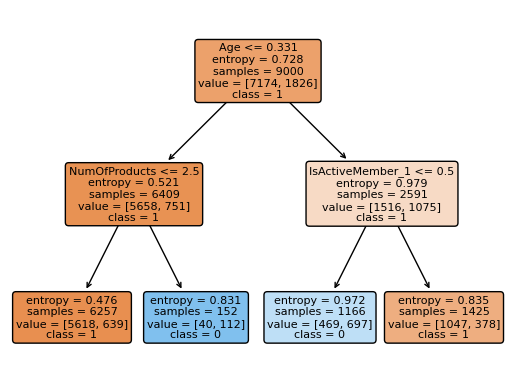

In [37]:
# Method 3 : Visualising the Decision Tree Using plot_tree() Function

# Defining the Decision Tree Graph Data
decision_tree_graph = tree.plot_tree(decision_tree_model, feature_names=raw_data_pp.drop('Exited', axis=1).columns,
                                     class_names=raw_data_pp['Exited'].unique().astype(str),
                                     filled=True, rounded=True, fontsize=8)

# Visualising the Decision Tree
decision_tree_graph

In [38]:
features = raw_data_pp.drop('Exited', axis=1).columns
feature_names = []
for feature in features:
    feature_names.append(feature)
feature_names

['CreditScore',
 'Age',
 'Tenure',
 'Balance',
 'NumOfProducts',
 'EstimatedSalary',
 'Geography_France',
 'Geography_Germany',
 'Geography_Spain',
 'Gender_Female',
 'Gender_Male',
 'HasCrCard_0',
 'HasCrCard_1',
 'IsActiveMember_0',
 'IsActiveMember_1']

### Method 4 : Visualising the Decision Tree in Text Format using export_text() Function

In [39]:
# Method 4 : Visualising the Decision Tree in Text Format using export_text() Function

# Creating a List of Input Feature Names
features = raw_data_pp.drop('Exited', axis=1).columns
feature_names_list = []
for feature in features:
    feature_names_list.append(feature)

# Defining the Decision Tree Textual Representation Data
decision_tree_text = tree.export_text(decision_tree_model, feature_names=feature_names_list,
                                      spacing=4)

# Visualising the Decision Tree in the Textual Format
print(decision_tree_text)

|---- Age <= 0.33
|    |---- NumOfProducts <= 2.50
|    |    |---- class: 0
|    |---- NumOfProducts >  2.50
|    |    |---- class: 1
|---- Age >  0.33
|    |---- IsActiveMember_1 <= 0.50
|    |    |---- class: 1
|    |---- IsActiveMember_1 >  0.50
|    |    |---- class: 0



## 9. RETRIEVING THE FEATURE IMPORTANCE VALUES OF THE INPUT FEATURES

In [40]:
# Retrieving the Information Gain i.e.; Feature Importance Values of the Input Features

# Creating an Empty Data Frame to Hold the Feature Name and the Feature's Importance Values
ig_df_final = pd.DataFrame()

# Looping Through Each and Every Input Feature and Retrieving the Feature Importance Value for Each Feature
for feature, column in enumerate(raw_data_pp.drop('Exited', axis=1)):
    print("{} - {}".format(column, decision_tree_model.feature_importances_[feature]))

    # Creating a Data Frame to Include the Feature Name and the Corresponding Feature Importance Value
    ig_df = pd.DataFrame({'Feature': [column], 'Feature Importance': [decision_tree_model.feature_importances_[feature]]})

    # Concatenating the Individual Feature Data Frame with the Final Data Frame
    ig_df_final = pd.concat([ig_df_final, ig_df], axis=0, ignore_index=True)

# Ordering the Feature Importance Values in the Increasing Order of Importance
ig_df_final_sorted = ig_df_final.sort_values(by='Feature Importance', ascending=False).reset_index(drop=True)

ig_df_final_sorted

CreditScore - 0.0
Age - 0.5983144137639937
Tenure - 0.0
Balance - 0.0
NumOfProducts - 0.21146037413712984
EstimatedSalary - 0.0
Geography_France - 0.0
Geography_Germany - 0.0
Geography_Spain - 0.0
Gender_Female - 0.0
Gender_Male - 0.0
HasCrCard_0 - 0.0
HasCrCard_1 - 0.0
IsActiveMember_0 - 0.0
IsActiveMember_1 - 0.1902252120988764


,Feature,Feature Importance
0,Age,0.598314
1,NumOfProducts,0.211460
2,IsActiveMember_1,0.190225
3,CreditScore,0.000000
4,Tenure,0.000000
5,Balance,0.000000
6,EstimatedSalary,0.000000
7,Geography_France,0.000000
8,Geography_Germany,0.000000
9,Geography_Spain,0.000000


## 10. CALCULATING AND COMPARING THE TRAINING AND VALIDATION ACCURACY

In [41]:
# Accuracy on the Train Data
print("Training Accuracy: ", decision_tree_model.score(X_train, y_train))

# Accuracy on the Validation Data
print("Validation Accuracy: ", decision_tree_model.score(X_validate, y_validate))

Training Accuracy:  0.8304444444444444
Validation Accuracy:  0.82


## 11. VALIDATING THE CLASSIFIER RESULTS ON THE VALIDATION DATA

In [42]:
# Validating the Classifier Results on the Validation Data

y_validate_pred = decision_tree_model.predict(X_validate)

y_validate_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

## 12. COMPARING THE VALIDATION ACTUALS WITH THE VALIDATION PREDICTIONS

In [43]:
# Comparing the Validation Predictions with the Validation Actuals for the first 20 Data Instances

# Validation Actuals
print(y_validate[:20])

# Validation Predictions
print(y_validate_pred[:20])

[0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0]


## 13. CONFUSION MATRIX BETWEEN THE VALIDATION ACTUALS AND THE VALIDATION PREDICTIONS

In [44]:
# Defining the Instance of Confusion Matrix
cm_validation_matrix = confusion_matrix(y_validate, y_validate_pred)

print("Execution Completed")

Execution Completed


## Method 1 : Plotting the Confusion Matrix with Numeric Values using Seaborn heatmap() Function

<Axes: >

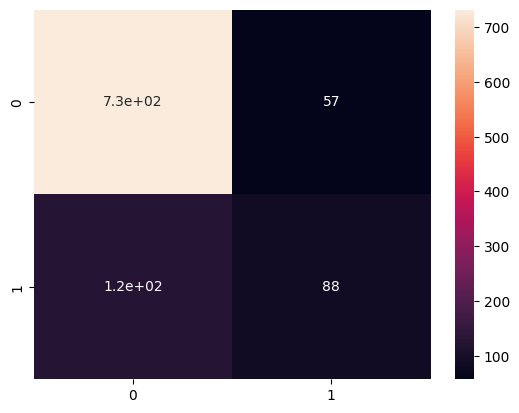

In [45]:
# Method 1 : Plotting the Confusion Matrix with Numeric Values using Seaborn heatmap() Function

churn_cm_plot_1 = sns.heatmap(cm_validation_matrix, annot=True)
churn_cm_plot_1

## Method 2 : Plotting the Confusion Matrix with Percentage Values using Seaborn heatmap() Function

<Axes: >

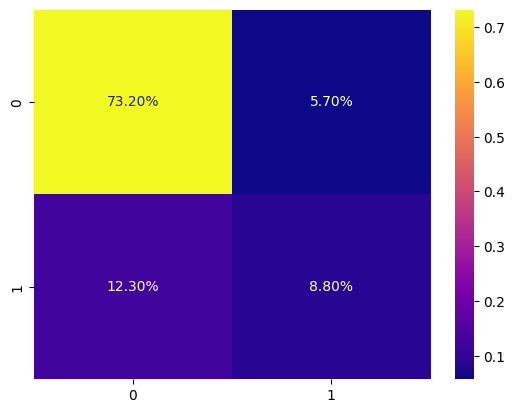

In [46]:
# Method 2 : Plotting the Confusion Matrix with Percentage Values Rounded-off to 2 Decimal Places using Seaborn heatmap() Function

churn_cm_plot_2 = sns.heatmap(cm_validation_matrix/np.sum(cm_validation_matrix), annot=True, fmt='0.2%', cmap='plasma')
churn_cm_plot_2

## Method 3 : Plotting the Confusion Matrix with Numeric Values, Percentage Values and the Corresponding Text using Seaborn heatmap() Function

<Axes: >

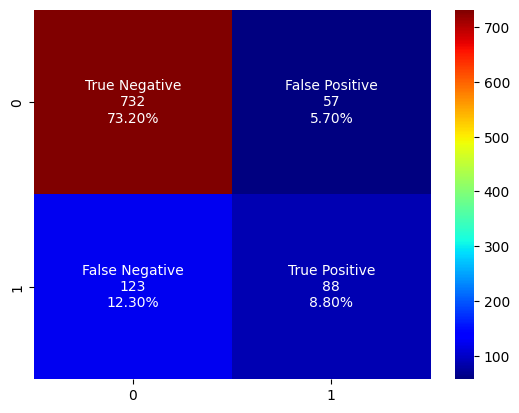

In [47]:
# Method 3 : Plotting the Confusion Matrix with Numeric Values, Percentage Values and the Corresponding Text using Seaborn heatmap() Function

cm_names = ['True Negative', 'False Positive', 'False Negative', 'True Positive']

cm_counts = ["{0:0.0f}".format(value) for value in cm_validation_matrix.flatten()]

cm_percentages = ["{0:0.2%}".format(value) for value in cm_validation_matrix.flatten()/np.sum(cm_validation_matrix)]

cm_labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(cm_names,cm_counts,cm_percentages)]

cm_labels = np.asarray(cm_labels).reshape(2,2)

sns.heatmap(cm_validation_matrix, annot=cm_labels, fmt='', cmap='jet')

## 14. CLASSIFICATION REPORT BETWEEN THE VALIDATION ACTUALS AND THE VALIDATION PREDICTIONS

In [48]:
# Classification Report and Metrics between the Validation Actuals and the Validation Predictions

target_names = ['No Churn', 'Churn']

# Defining the Classification Report for the Validation Data
classification_report_validation = classification_report(y_validate, y_validate_pred, target_names=target_names)

# Displaying the Classification Report
print(classification_report_validation)

              precision    recall  f1-score   support

    No Churn       0.86      0.93      0.89       789
       Churn       0.61      0.42      0.49       211

    accuracy                           0.82      1000
   macro avg       0.73      0.67      0.69      1000
weighted avg       0.80      0.82      0.81      1000



## 15. INDIVIDUAL CLASSIFIER METRICS BETWEEN THE VALIDATION ACTUALS AND THE VALIDATION PREDICTIONS

In [49]:
# Individual Classifier Metrics between the Validation Actuals and the Validation Predictions

# Accuracy
churn_accuracy = round((accuracy_score(y_validate, y_validate_pred))*100, 2)

# F1-score
churn_f1_score = round((f1_score(y_validate, y_validate_pred)*100), 2)

# Precision
churn_precision = round((precision_score(y_validate, y_validate_pred)*100), 2)

# Recall
churn_recall = round((recall_score(y_validate, y_validate_pred)*100), 2)

# ROC AUC Score
churn_roc_auc_score = round((roc_auc_score(y_validate, y_validate_pred)*100), 2)

print("Customer Churn Classifier - Accuracy: {}%".format(churn_accuracy))
print("Customer Churn Classifier - F1-Score: {}%".format(churn_f1_score))
print("Customer Churn Classifier - Precision: {}%".format(churn_precision))
print("Customer Churn Classifier - Recall: {}%".format(churn_recall))
print("Customer Churn Classifier - ROC AUC Score: {}%".format(churn_roc_auc_score))

Customer Churn Classifier - Accuracy: 82.0%
Customer Churn Classifier - F1-Score: 49.44%
Customer Churn Classifier - Precision: 60.69%
Customer Churn Classifier - Recall: 41.71%
Customer Churn Classifier - ROC AUC Score: 67.24%
